In [1]:
from sstadex import Macromodel, Primitive, Test, dfs, simplediffpair, cs_pmos, cm_pmos, spice_sim, diffpair_cc, current_mirror_cc
import numpy as np
from sympy import Symbol
from sympy.solvers import solve
import matplotlib.pyplot as plt
import paretoset as pareto
import pandas as pd
from sympy import lambdify
from sstadex import Transistor
import seaborn as sns
sns.set_theme()
sns.color_palette("mako")

import sys

sys.path.insert(0, "../../..")
from gmid.mosplot import load_lookup_table, LoadMosfet

In [2]:
## Exploration parameters

N_points = 10
lengths_nmos = [0.45e-06, 0.8e-06, 1.6e-06, 3.2e-06, 6.4e-6]
lengths_pmos = [0.4e-06, 0.8e-06, 1.6e-06, 3.2e-06, 6.4e-6]

## Electrical parameters

Vout = 1.2                                      # LDO output voltage
Vin = 1.8                                       # LDO supply voltage
Vref = 0.9                                      # LDO voltage reference
IL = 100e-3                                     # Load current
CL = 0.5e-12                                    # Load capacitance
RL = Vout/IL

## LDO specifications

efficiency = 0.99
psrr_condition = -70
estability_condition = 60
linereg_condition = 0.5
loadreg_condition = 0.7
#iq_condition = 20e-6
size_condition = 1e-3

I_bias = 5e-6
I_amp1 = 40e-6 # considering the two branches of differential pair
I_amp2 = 40e-6

Iq_max = IL*(1-efficiency)
Ib_pt = Iq_max-I_amp1-I_amp2-I_bias

R1 = (Vout-Vref)/Ib_pt
R2 = Vref*R1/(Vout-Vref)

LDO = pd.DataFrame.from_dict({'Vout': [Vout], 'Vin': [Vin], 'Vref': [Vref], 'IL': [IL], 'CL': [CL], 'RL': [RL], 'Iq_max': [Iq_max], 'Ib_pt': [Ib_pt], 'R1': [R1], 'R2': [R2]}, orient='index', columns=['Value'])
LDO

,Value
Vout,1.200000e+00
Vin,1.800000e+00
Vref,9.000000e-01
IL,1.000000e-01
CL,5.000000e-13
RL,1.200000e+01
Iq_max,1.000000e-03
Ib_pt,9.150000e-04
R1,3.278689e+02
R2,9.836066e+02


# Pre-exploration

## Macromodels

In [4]:
V2stage_out = np.linspace(Vout-Vin+0.5, Vout-Vin-0.8, N_points)

LDO_macro = Macromodel(
    name ='LDO_macro', 
    outputs= [
        Symbol("W_2stage"), Symbol("L_2stage"),
        Symbol("vin_2stage"),
        Symbol('W_cs_2stage'), Symbol('L_cs_2stage'),
        Symbol('vgs_cs_2stage'),
        Symbol("W_diff"), Symbol("L_diff"), 
        Symbol("vout_1stage"),
        Symbol("W_al"), Symbol("L_al"),
        Symbol("W_cs"), Symbol("L_cs"),
        Symbol('vgs_cs'),
        Symbol("W_pt"), Symbol("L_pt"),
        Symbol("W_cc"), Symbol("L_cc"),
        Symbol("W_rc"), Symbol("L_rc")],
    electrical_parameters={
        "Vdd": Vin, 
        "Vref": Vref, 
        "Vout": Vout, 
        "V2stage_out": V2stage_out,
        "Il": IL+Ib_pt}
    )

LDO_macro.area_conditions = {
    "max": [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
    "min": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}

V1stage_out = np.linspace(1-0.3, 1+0.6, 5)

OTA_macro = Macromodel(
    name = 'OTA_macro',
    outputs = [
        Symbol("W_2stage"), Symbol("L_2stage"),
        Symbol("vin_2stage"),
        Symbol('W_cs_2stage'), Symbol('L_cs_2stage'),
        Symbol('vgs_cs_2stage'),
        Symbol("W_diff"), Symbol("L_diff"), 
        Symbol("vout_1stage"),
        Symbol("W_al"), Symbol("L_al"),
        Symbol("W_cs"), Symbol("L_cs"),
        Symbol('vgs_cs'),
        Symbol("W_cc"), Symbol("L_cc"),
        Symbol("W_rc"), Symbol("L_rc")],
    electrical_parameters = {
        "Vdd": LDO_macro.electrical_parameters["Vdd"],
        "Vref": LDO_macro.electrical_parameters["Vref"],
        "Vout": LDO_macro.electrical_parameters["V2stage_out"],
        "V1stage_out": V1stage_out,
        "Il": I_amp2},
    macromodel_parameters={
        Symbol('Ra'): np.logspace(3, 7, N_points),
        Symbol('gma'): np.logspace(-5, -2, N_points)}
    )

OTA_macro.area_conditions = {
    "max": [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
    "min": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}

OTA_2stage_macro = Macromodel(
    name = 'OTA_2stage_macro',
    outputs = [
        Symbol("W_2stage"), Symbol("L_2stage"),
        Symbol("vin_2stage"),
        Symbol('W_cs_2stage'), Symbol('L_cs_2stage'),
        Symbol('vgs_cs_2stage')],
    electrical_parameters = {
        "Vdd": OTA_macro.electrical_parameters["Vdd"],
        "Vin": OTA_macro.electrical_parameters["V1stage_out"],
        "Vout": OTA_macro.electrical_parameters["Vout"],
        "Il": I_amp2},
    macromodel_parameters={
        Symbol('Ra_2stage'): np.logspace(3, 7, 5),
        Symbol('gma_2stage'): np.logspace(-5, -2, 5),
        Symbol('Cin_2stage'): np.logspace(-16, -11, 5)}
    )

OTA_2stage_macro.area_conditions = {
    "max": [2e-4, 2e-4, 10, 2e-4, 2e-4, 10],
    "min": [5e-6, 0, 0, 5e-6, 0, 0]}

OTA_1stage_macro = Macromodel(
    name = 'OTA_1stage_macro',
    outputs = [
        Symbol("W_diff"), Symbol("L_diff"), 
        Symbol("vout_1stage"),
        Symbol("W_al"), Symbol("L_al"),
        Symbol("W_cs"), Symbol("L_cs"),
        Symbol('vgs_cs')],
    electrical_parameters = {
        "Vdd": OTA_macro.electrical_parameters["Vdd"],
        "Vref": OTA_macro.electrical_parameters["Vref"],
        "Vout": OTA_macro.electrical_parameters["V1stage_out"],
        "Il": I_amp1},
    macromodel_parameters={
        Symbol('Ra_1stage'): np.logspace(3, 7, N_points),
        Symbol('gma_1stage'): np.logspace(-5, -2, N_points)}
    ) 

OTA_1stage_macro.area_conditions = {
    "max": [2e-4, 2e-4, 10, 2e-4, 2e-4, 2e-4, 2e-4, 10],
    "min": [5e-6, 0, 5e-6, 0, 0, 5e-6, 0, 0]}

## Testbenches

### LDO

In [5]:
psrr_LDO_macro = Test()
psrr_LDO_macro.name = "psrr_LDO"
psrr_LDO_macro.tf = ["vout", "vdd"]
psrr_LDO_macro.netlist = "ldo"
psrr_LDO_macro.parametros = {Symbol("V1"): 1,
                             Symbol("V2"): 0,
                             Symbol("s"): 0,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2}

psrr_LDO_macro.opt_goal = "min"
psrr_LDO_macro.conditions = {"max": [10**(100/20)]}
psrr_LDO_macro.variables = {}
psrr_LDO_macro.out_def = {"eval": psrr_LDO_macro.tf}

##############################################################################

dc_LDO_macro = Test()
dc_LDO_macro.name = "dc_LDO"
dc_LDO_macro.tf = ["vout", "vdd"]
dc_LDO_macro.netlist = "ldo"
dc_LDO_macro.parametros = {Symbol("V1"): Vin,
                           Symbol("V2"): Vref,
                           Symbol("s"): 0,
                           Symbol("Rl"): RL,
                           Symbol("Cl"): CL,
                           Symbol("R1"): R1, 
                           Symbol("R2"): R2}

dc_LDO_macro.opt_goal = "min"
dc_LDO_macro.conditions = {"min": [0]}
dc_LDO_macro.variables = {}
dc_LDO_macro.out_def = {"eval": dc_LDO_macro.tf}
x = Symbol("x")
dc_LDO_macro.lamd = lambdify(x, x*3.3)

##############################################################################

gain_ol_LDO_macro = Test()
gain_ol_LDO_macro.name = "gain_ol_LDO"
gain_ol_LDO_macro.tf = ["vout", "vol"]
gain_ol_LDO_macro.netlist = "ldo_ol"
gain_ol_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("s"): 0,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

gain_ol_LDO_macro.opt_goal = "min"
gain_ol_LDO_macro.conditions = {"min": [1]}
gain_ol_LDO_macro.variables = {}
gain_ol_LDO_macro.out_def = {"eval": gain_ol_LDO_macro.tf}

##############################################################################

phase_margin_LDO_macro = Test()
phase_margin_LDO_macro.name = "phase_margin_LDO"
phase_margin_LDO_macro.tf = ["vout", "vol"]
phase_margin_LDO_macro.netlist = "ldo_ol"
phase_margin_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

phase_margin_LDO_macro.opt_goal = "min"
phase_margin_LDO_macro.conditions = {"min": [-100]}
phase_margin_LDO_macro.variables = {}
phase_margin_LDO_macro.out_def = {"pm": phase_margin_LDO_macro.tf}

### OTA

In [6]:
gain_OTA = Test()
gain_OTA.name = "gain_OTA"
gain_OTA.tf = ["vout", "vpos"]
gain_OTA.netlist = "OpAmp_2stage"
gain_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("I_amp2"): 0,
    Symbol("s"): 0}

gain_OTA.opt_goal = "max"
gain_OTA.conditions = {"min": [10**(-100/20)]}
gain_OTA.variables = {}
gain_OTA.out_def = {"eval": gain_OTA.tf}

#########################################################

phase_margin_OTA = Test()
phase_margin_OTA.name = "phase_margin_OTA"
phase_margin_OTA.tf = ["vout", "vpos"]
phase_margin_OTA.netlist = "OpAmp_2stage"
phase_margin_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("Cin_pt"): 2.5160347955371574e-11}

phase_margin_OTA.opt_goal = "min"
phase_margin_OTA.conditions = {"min": [-200]}
phase_margin_OTA.variables = {}
phase_margin_OTA.out_def = {"pm": phase_margin_OTA.tf}

##########################################################

rout_OTA = Test()
rout_OTA.name = "rout_OTA"
rout_OTA.target_param = Symbol("Ra")
rout_OTA.tf = ["vout", "vr"]
rout_OTA.netlist = "OpAmp_2stage_rout"
rout_OTA.parametros = {
    Symbol("Vpos"): 0,
    Symbol("Vr"): 1,
    Symbol("s"): 0,
    Symbol("Rr"): 1000,
    Symbol("Cin_pt"): 2.5160347955371574e-11}

rout_OTA.opt_goal = "max"
rout_OTA.conditions = {"min": [1]}
x = Symbol("x")
rout_OTA.lamd = lambdify(x, x*1000/(1-x))
rout_OTA.variables = {}
rout_OTA.out_def = {"eval": rout_OTA.tf}

##########################################################

gm_OTA = Test()
gm_OTA.target_param = Symbol("gma")
gm_OTA.name = "gm_OTA"
gm_OTA.tf = ["vout", "vpos"]
gm_OTA.netlist = "OpAmp_2stage"
gm_OTA.composed = 1
gm_OTA.out_def = {"divide": [gain_OTA, rout_OTA]}
gm_OTA.opt_goal = "max"
gm_OTA.conditions = {"min": [0.000000001]}

### OTA 1stage

In [7]:
gain_1stage_OTA = Test()
gain_1stage_OTA.tf = ("vout", "vpos")
gain_1stage_OTA.name = "gain_1stage"
gain_1stage_OTA.netlist = "ota_1stage"
gain_1stage_OTA.parametros = {
    Symbol("gdiff_2"): Symbol("gdiff_1"),
    Symbol("Rdiff_2"): Symbol("Rdiff_1"),
    Symbol("gaload_2"): Symbol("gaload_1"),
    Symbol("Raload_2"): Symbol("Raload_1"),
    Symbol("V1"): 0,
    Symbol("V_n"): 0,
    Symbol("V_p"): 1,
    Symbol("I2"): 0,
    Symbol("s"): 0}
gain_1stage_OTA.opt_goal = "max"
gain_1stage_OTA.conditions = {"min": [10**(-100/20)]}
gain_1stage_OTA.variables = {}
gain_1stage_OTA.out_def = {"eval": gain_1stage_OTA.tf}

##################################################################

psrr_1stage_OTA = Test()
psrr_1stage_OTA.tf = ("vout", "vdd")
psrr_1stage_OTA.name = "psrr_1stage"
psrr_1stage_OTA.netlist = "ota_1stage"
psrr_1stage_OTA.parametros = {
    Symbol("gdiff_2"): Symbol("gdiff_1"),
    Symbol("Rdiff_2"): Symbol("Rdiff_1"),
    Symbol("gaload_2"): Symbol("gaload_1"),
    Symbol("Raload_2"): Symbol("Raload_1"),
    Symbol("V1"): 1,
    Symbol("V_n"): 0,
    Symbol("V_p"): 0,
    Symbol("I2"): 0,
    Symbol("s"): 0}
psrr_1stage_OTA.opt_goal = "max"
psrr_1stage_OTA.conditions = {"min": [0.0000001]}
psrr_1stage_OTA.variables = {}
psrr_1stage_OTA.out_def = {"eval": psrr_1stage_OTA.tf}

##################################################################

rout_1stage_OTA = Test()
rout_1stage_OTA.name = "rout_1stage"
rout_1stage_OTA.target_param = Symbol("Ra_1stage")
rout_1stage_OTA.tf = ["vout", "vr"]
rout_1stage_OTA.netlist = "ota_1stage_rout"
rout_1stage_OTA.parametros = {Symbol("gdiff_2"): Symbol("gdiff_1"),
                              Symbol("Rdiff_2"): Symbol("Rdiff_1"),
                                Symbol("gaload_2"): Symbol("gaload_1"),
                                Symbol("Raload_2"): Symbol("Raload_1"),
                                Symbol("V1"): 0,
                                Symbol("V_n"): 0,
                                Symbol("V_p"): 0,
                                Symbol("Vr"): 1,
                                Symbol("I2"): 0,
                                Symbol("s"): 0,
                                Symbol("Rr"): 1000,
                                Symbol("Cl"): 1e-12}

rout_1stage_OTA.opt_goal = "max"
rout_1stage_OTA.conditions = {"min": [1]}
x = Symbol("x")
rout_1stage_OTA.lamd = lambdify(x, x*1000/(1-x))
rout_1stage_OTA.variables = {}
rout_1stage_OTA.out_def = {"eval": rout_1stage_OTA.tf}

##################################################################

gm_1stage_OTA = Test()
gm_1stage_OTA.target_param = Symbol("gma_1stage")
gm_1stage_OTA.name = "gm_1stage"
gm_1stage_OTA.tf = ["vout", "vpos"]
gm_1stage_OTA.netlist = "ota_1stage"
gm_1stage_OTA.composed = 1
gm_1stage_OTA.out_def = {"divide": [gain_1stage_OTA, rout_1stage_OTA]}
gm_1stage_OTA.opt_goal = "max"
gm_1stage_OTA.conditions = {"min": [9.999999999999999e-6]}

### OTA 2stage

In [8]:
gain_2stage_OTA = Test()
gain_2stage_OTA.tf = ("vout", "vin")
gain_2stage_OTA.name = "gain_2stage"
gain_2stage_OTA.netlist = "ota_2stage_v2"
gain_2stage_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("V2"): 1,
    Symbol("s"): 0,
    Symbol("Cin_pt"): 2.5160347955371574e-11}
gain_2stage_OTA.opt_goal = "max"
gain_2stage_OTA.conditions = {"min": [1]}
gain_2stage_OTA.variables = {}
gain_2stage_OTA.out_def = {"eval": gain_2stage_OTA.tf}

##################################################################

rout_2stage_OTA = Test()
rout_2stage_OTA.name = "rout_2stage"
rout_2stage_OTA.target_param = Symbol("Ra_2stage")
rout_2stage_OTA.tf = ["vout", "vr"]
rout_2stage_OTA.netlist = "ota_2stage_rout_v2"
rout_2stage_OTA.parametros = {Symbol("V1"): 0,
                              Symbol("V2"): 0,
                                Symbol("Vr"): 1,
                                Symbol("s"): 0,
                                Symbol("Rr"): 1000,
                                Symbol("Cin_pt"): 2.5160347955371574e-11}

rout_2stage_OTA.opt_goal = "max"
rout_2stage_OTA.conditions = {"min": [1]}
x = Symbol("x")
rout_2stage_OTA.lamd = lambdify(x, x*1000/(1-x))
rout_2stage_OTA.variables = {}
rout_2stage_OTA.out_def = {"eval": rout_2stage_OTA.tf}

##################################################################

gm_2stage_OTA = Test()
gm_2stage_OTA.target_param = Symbol("gma_2stage")
gm_2stage_OTA.name = "gm_2stage"
gm_2stage_OTA.tf = ["vout", "vin"]
gm_2stage_OTA.netlist = "ota_2stage_v2"
gm_2stage_OTA.composed = 1
gm_2stage_OTA.out_def = {"divide": [gain_2stage_OTA, rout_2stage_OTA]}
gm_2stage_OTA.opt_goal = "max"
gm_2stage_OTA.conditions = {"min": [0.000000001]}

## Primitives

### LDO

In [9]:
# CASE 1: WITH LOAD

pt = cs_pmos(
    lut_file="../../LUTs/ihp_lut_hv_20w.npy",
    netlist='pmos_cm.spice', 
    type='pmos', 
    inputs={
        'vds_lut': LDO_macro.electrical_parameters["Vout"]-LDO_macro.electrical_parameters["Vdd"], 
        'vgs_lut': (-2, -0.1, 0.01), 
        'vgs': LDO_macro.electrical_parameters["V2stage_out"], 
        'il': LDO_macro.electrical_parameters["Il"],
        'length': lengths_pmos, 
        '2d_var': ['length', 'vgs']})

pt.build()

pt.parameters = {
    Symbol('gm_pt'): np.asarray(pt.gm).flatten(),
    Symbol('Ro_pt'): np.asarray(pt.Ro).flatten(),
    Symbol("Cgg_pt"): np.asarray(pt.cgg).flatten(),
    Symbol("Cgd_pt"): np.asarray(pt.cgd).flatten(),
    Symbol("Cin_pt"): np.asarray(pt.cgg).flatten()+np.asarray(pt.cgd).flatten()*np.asarray(pt.gm).flatten()*np.asarray(pt.Ro).flatten(),
    Symbol("dropout"): 2/(np.asarray(pt.gm).flatten()/pt.inputs['il']),
    Symbol('vout_2stage'): np.tile(LDO_macro.electrical_parameters["V2stage_out"], 5)}

pt.outputs = {
    Symbol("W_pt"): np.asarray(pt.W).flatten(),
    Symbol("L_pt"): np.asarray(pt.L).flatten()}

# CASE 2: WITHOUT LOAD

## found operation point of the circuit with no load
lookup_table = load_lookup_table('../../LUTs/IHP_LUT_hv_20w.npy')

pt_lutable = LoadMosfet(
            lookup_table=lookup_table,
            mos='pmos',
            vsb=0,
            vds=LDO_macro.electrical_parameters["Vout"]-LDO_macro.electrical_parameters["Vdd"],
            vgs=(-2.5, -0.1, 0.01),
            lengths=lengths_pmos,
        )

jd_2 = Ib_pt/pt.W.flatten()

vgs_2 = pt_lutable.interpolate(
            x_expression=pt_lutable.current_density_expression,
            x_value=jd_2,
            y_expression=pt_lutable.lengths_expression,
            y_value=pt.L.flatten(),
            z_expression=pt_lutable.vgs_expression,
        )

vgs_2 = np.diag(vgs_2)
print("Values of Vgs_pt when there is no load: ", vgs_2)
##

vout_2stage_wc = vgs_2

pt_wc = cs_pmos(
    lut_file="../../LUTs/ihp_lut_hv_20w.npy",
    netlist='pmos_cm.spice', 
    type='pmos', 
    inputs={
        'vds_lut': LDO_macro.electrical_parameters["Vout"]-LDO_macro.electrical_parameters["Vdd"], 
        'vgs_lut': (-2, -0.1, 0.01), 
        'vgs': vout_2stage_wc, 
        'il': Ib_pt,
        'length': pt.L.flatten(), 
        '2d_var': ['length', 'vgs']})

pt_wc.build()

pt_wc.parameters = {
    Symbol('gm_pt'): np.asarray(pt_wc.gm.diagonal()).flatten(),
    Symbol('Ro_pt'): np.asarray(pt_wc.Ro.diagonal()).flatten(),
    Symbol("Cgg_pt"): np.asarray(pt_wc.cgg.diagonal()).flatten(),
    Symbol("Cgd_pt"): np.asarray(pt_wc.cgd.diagonal()).flatten(),
    Symbol("dropout"): 2/(np.asarray(pt_wc.gm.diagonal()).flatten()/pt_wc.inputs['il']),
    Symbol("Cin_pt"): np.asarray(pt_wc.cgg.diagonal()).flatten()+np.asarray(pt_wc.cgd.diagonal()).flatten()*np.asarray(pt_wc.gm.diagonal()).flatten()*np.asarray(pt_wc.Ro.diagonal()).flatten(),
    Symbol('vout_2stage'): vout_2stage_wc}

pt_wc.outputs = {
    Symbol("W_pt"): np.asarray(pt.W).flatten(),
    Symbol("L_pt"): np.asarray(pt.L).flatten()}

length
vgs
0
Values of Vgs_pt when there is no load:  [        nan         nan -0.21175239 -0.34939443         nan -0.50666816
 -0.54479269 -0.5740396  -0.59794335 -0.61800759         nan         nan
 -0.139906   -0.34571088 -0.4643637  -0.532253   -0.57473708 -0.60608156
 -0.63144418 -0.65286868         nan         nan -0.1155049  -0.34312938
 -0.46899513 -0.54121614 -0.58542056 -0.61763201 -0.64370458 -0.66596659
         nan         nan -0.10810057 -0.35508006 -0.4707689  -0.54458477
 -0.58945945 -0.62204598 -0.64844888 -0.67114206         nan         nan
 -0.10534456 -0.30079744 -0.471492   -0.54587748 -0.59101215 -0.62376149
 -0.65031442 -0.67321482]
length
vgs
0


In [10]:
LDO_macro.electrical_parameters["V2stage_out"][7]

np.float64(-1.1111111111111114)

In [11]:
vout_2stage_wc[7]

np.float64(-0.5740396035819006)

### OTA

In [12]:
vs = np.linspace(0.3, 0.8, 5)

Cc = np.logspace(-13, -10, 3)
Rc = np.logspace(3, 4, 3)

mesh = np.meshgrid(Cc, Rc)

Cc_primitive = Primitive(parameters={Symbol("Cc"): mesh[0].flatten(),
                                     Symbol("Rc"): mesh[1].flatten()})
Cc_primitive.outputs = {
    Symbol("W_cc"): np.sqrt(Cc_primitive.parameters[Symbol("Cc")]/1.5e-15)*1e-6,
    Symbol("L_cc"): np.sqrt(Cc_primitive.parameters[Symbol("Cc")]/1.5e-15)*1e-6,
    Symbol("W_rc"): np.sqrt(Cc_primitive.parameters[Symbol("Rc")]/(1360*0.5))*1e-6,
    Symbol("L_rc"): np.repeat(0.5e-6, len(mesh[0].flatten()))}

### OTA 1stage

In [16]:
OTA_1stage_macro.electrical_parameters["Vout"] = np.repeat(OTA_1stage_macro.electrical_parameters["Vout"], len(lengths_nmos))

In [23]:
vds_diffpar = []
for vds in OTA_1stage_macro.electrical_parameters["Vout"]:
    vds_diffpar.append(vds-vs)

vgs_diffpar = OTA_1stage_macro.electrical_parameters["Vref"] - vs

vds_diffpar = np.asarray(vds_diffpar).flatten()
vgs_diffpar = np.tile(vgs_diffpar, len(OTA_1stage_macro.electrical_parameters["Vout"]))
print(vds_diffpar)
print(vgs_diffpar)

[ 0.4    0.275  0.15   0.025 -0.1    0.4    0.275  0.15   0.025 -0.1
  0.4    0.275  0.15   0.025 -0.1    0.4    0.275  0.15   0.025 -0.1
  0.4    0.275  0.15   0.025 -0.1    0.625  0.5    0.375  0.25   0.125
  0.625  0.5    0.375  0.25   0.125  0.625  0.5    0.375  0.25   0.125
  0.625  0.5    0.375  0.25   0.125  0.625  0.5    0.375  0.25   0.125
  0.85   0.725  0.6    0.475  0.35   0.85   0.725  0.6    0.475  0.35
  0.85   0.725  0.6    0.475  0.35   0.85   0.725  0.6    0.475  0.35
  0.85   0.725  0.6    0.475  0.35   1.075  0.95   0.825  0.7    0.575
  1.075  0.95   0.825  0.7    0.575  1.075  0.95   0.825  0.7    0.575
  1.075  0.95   0.825  0.7    0.575  1.075  0.95   0.825  0.7    0.575
  1.3    1.175  1.05   0.925  0.8    1.3    1.175  1.05   0.925  0.8
  1.3    1.175  1.05   0.925  0.8    1.3    1.175  1.05   0.925  0.8
  1.3    1.175  1.05   0.925  0.8  ]
[0.6   0.475 0.35  0.225 0.1   0.6   0.475 0.35  0.225 0.1   0.6   0.475
 0.35  0.225 0.1   0.6   0.475 0.35  0.225 0.1  

In [24]:
diffpair = simplediffpair(
    lut_file="../../LUTs/ihp_lut_hv_20w.npy",
    netlist='diffpair.spice',
    type='nmos',
    inputs = { 
        'vds_lut': (0.1, 2, 0.01),
        'vgs_lut': (0.1, 2.2, 0.01), 
        'vds': vds_diffpar, 
        'vgs': vgs_diffpar, 
        'il': I_amp1/2,
        'length': lengths_nmos, 
        '2d_var': ['vds', 'vgs']}
)

diffpair.build()

diffpair.parameters = {
    Symbol('gdiff_1'): np.asarray(diffpair.gm).flatten(),
    Symbol('Rdiff_1'): np.asarray(diffpair.Ro).flatten(),
    Symbol("vs_diff"): np.tile(np.tile(np.asarray(vs), len(OTA_1stage_macro.electrical_parameters["Vout"])), len(lengths_nmos))}

diffpair.outputs = {
    Symbol("W_diff"): np.asarray(diffpair.W).flatten(),
    Symbol("L_diff"): np.asarray(diffpair.L).flatten(),
    Symbol("vout_1stage"): np.tile(np.repeat(OTA_1stage_macro.electrical_parameters["Vout"], len(vs)), 5)}

diffpair_dict = {}
diffpair_dict.update(diffpair.parameters)
diffpair_dict.update(diffpair.outputs)
diffpair_df = pd.DataFrame(diffpair_dict)

diffpair_df = diffpair_df[diffpair_df[Symbol("W_diff")]<2e-4]

diffpair.parameters[Symbol("gdiff_1")] = diffpair_df[Symbol("gdiff_1")].values
diffpair.parameters[Symbol("Rdiff_1")] = diffpair_df[Symbol("Rdiff_1")].values
diffpair.parameters[Symbol("vs_diff")] = diffpair_df[Symbol("vs_diff")].values

diffpair.outputs[Symbol("W_diff")] = diffpair_df[Symbol("W_diff")].values
diffpair.outputs[Symbol("L_diff")] = diffpair_df[Symbol("L_diff")].values
diffpair.outputs[Symbol("vout_1stage")] = diffpair_df[Symbol("vout_1stage")].values

##############################################################################

activeload = cm_pmos(
    lut_file="../../LUTs/ihp_lut_hv_20w.npy",
    netlist='pmos_cs.spice',
    type='pmos',
    inputs={
        'vds_lut': (-1.7, -0.1, 0.01), 
        'vgs_lut': (-1.8, -0.1, 0.01), 
        'vds': OTA_1stage_macro.electrical_parameters["Vout"]-OTA_1stage_macro.electrical_parameters["Vdd"],
        'vgs': OTA_1stage_macro.electrical_parameters["Vout"]-OTA_1stage_macro.electrical_parameters["Vdd"], 
        'il': I_amp1/2,
        'length': lengths_pmos, 
        '2d_var': ['vds', 'vgs']})

activeload.build()

activeload.parameters = {
    Symbol('gaload_1'): np.asarray(activeload.gm).flatten(),
    Symbol('Raload_1'): np.asarray(activeload.Ro).flatten(),
    Symbol('vout_aload'): np.tile(OTA_1stage_macro.electrical_parameters["Vout"], 5)}

activeload.outputs = {
    Symbol("W_al"): np.asarray(activeload.W).flatten(),
    Symbol("L_al"): np.asarray(activeload.L).flatten()}

#############################################################################

currentsource = cm_pmos()
currentsource.parameters = {
    Symbol('gcs'): [],
    Symbol('Rcs'): [],
    Symbol('vs_cs'): [],
    Symbol('vgs_cs'): []}
currentsource.outputs = {
    Symbol("W_cs"): [],
    Symbol("L_cs"): []}


stage2_cs = cm_pmos()
stage2_cs.parameters = {
    Symbol('gcs_2stage'): [],
    Symbol('Rcs_2stage'): [],
    Symbol('vgs_cs_2stage'): []}
stage2_cs.outputs = {
    Symbol("W_cs_2stage"): [],
    Symbol("L_cs_2stage"): []}

for vds_cs in vs:

    vgs_cs = np.linspace(vds_cs-0.2, vds_cs+0.6, 5)

    currentsource_aux = cm_pmos(
        lut_file="../../LUTs/ihp_lut_hv_20w.npy",
        netlist='pmos_cs.spice',
        type='nmos',
        inputs={
            'vds_lut': vds_cs, 
            'vgs_lut': (0.1, 2, 0.01), 
            'vgs': vgs_cs, 
            'il': I_amp1,
            'length': lengths_nmos, 
            '2d_var': ['length', 'vgs']})
    currentsource_aux.build()

    currentsource.parameters[Symbol('gcs')].append(np.asarray(currentsource_aux.gm).flatten())
    currentsource.parameters[Symbol('Rcs')].append(np.asarray(currentsource_aux.Ro).flatten())
    currentsource.parameters[Symbol('vs_cs')].append(np.asarray(np.repeat(vds_cs, len(lengths_nmos)*len(vgs_cs))).flatten())
    currentsource.parameters[Symbol('vgs_cs')].append(np.asarray(np.tile(vgs_cs, len(lengths_nmos))).flatten())
    currentsource.outputs[Symbol('W_cs')].append(np.asarray(currentsource_aux.W).flatten())
    currentsource.outputs[Symbol('L_cs')].append(np.asarray(currentsource_aux.L).flatten())

    for vds_aux in [-1.11]:

        stage2_cs_aux = cm_pmos(
        lut_file="../../LUTs/ihp_lut_hv_20w.npy",
        netlist='pmos_cs.spice',
        type='nmos',
        inputs={
            'vds_lut': 1.8+vds_aux,
            'vgs_lut': (0.1, 2, 0.01),
            'vgs': vgs_cs,
            'il': OTA_2stage_macro.electrical_parameters['Il'],
            'length': lengths_nmos,
            '2d_var': ['length', 'vgs']}
            )
        stage2_cs_aux.build()
        
        stage2_cs.parameters[Symbol('gcs_2stage')].append(np.asarray(stage2_cs_aux.gm).flatten())
        stage2_cs.parameters[Symbol('Rcs_2stage')].append(np.asarray(stage2_cs_aux.Ro).flatten())
        stage2_cs.parameters[Symbol('vgs_cs_2stage')].append(np.asarray(np.tile(vgs_cs, len(lengths_nmos))).flatten())
        stage2_cs.outputs[Symbol('W_cs_2stage')].append(np.asarray(currentsource_aux.W).flatten())
        stage2_cs.outputs[Symbol('L_cs_2stage')].append(np.asarray(currentsource_aux.L).flatten())


currentsource.parameters[Symbol('gcs')] = np.asarray(currentsource.parameters[Symbol('gcs')]).flatten()
currentsource.parameters[Symbol('Rcs')] = np.asarray(currentsource.parameters[Symbol('Rcs')]).flatten()
currentsource.parameters[Symbol('vs_cs')] = np.asarray(currentsource.parameters[Symbol('vs_cs')]).flatten()
currentsource.parameters[Symbol('vgs_cs')] = np.asarray(currentsource.parameters[Symbol('vgs_cs')]).flatten()
currentsource.outputs[Symbol('W_cs')] = np.asarray(currentsource.outputs[Symbol('W_cs')]).flatten()
currentsource.outputs[Symbol('L_cs')] = np.asarray(currentsource.outputs[Symbol('L_cs')]).flatten()
currentsource.outputs[Symbol('vgs_cs')] = currentsource.parameters[Symbol('vgs_cs')]

stage2_cs.parameters[Symbol('gcs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('gcs_2stage')]).flatten()
stage2_cs.parameters[Symbol('Rcs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('Rcs_2stage')]).flatten()
stage2_cs.parameters[Symbol('vgs_cs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('vgs_cs_2stage')]).flatten()
stage2_cs.outputs[Symbol('W_cs_2stage')]=np.asarray(stage2_cs.outputs[Symbol('W_cs_2stage')]).flatten()
stage2_cs.outputs[Symbol('L_cs_2stage')]=np.asarray(stage2_cs.outputs[Symbol('L_cs_2stage')]).flatten()
stage2_cs.outputs[Symbol('vgs_cs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('vgs_cs_2stage')]).flatten()

vds
vgs
1
vds
vgs
1
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0


In [28]:
OTA_1stage_macro.electrical_parameters["Vout"]

array([0.7  , 0.7  , 0.7  , 0.7  , 0.7  , 0.925, 0.925, 0.925, 0.925,
       0.925, 1.15 , 1.15 , 1.15 , 1.15 , 1.15 , 1.375, 1.375, 1.375,
       1.375, 1.375, 1.6  , 1.6  , 1.6  , 1.6  , 1.6  ])

In [29]:
diffpair.outputs[Symbol("vout_1stage")]

array([0.7  , 0.7  , 0.7  , 0.7  , 0.7  , 0.925, 0.925, 0.925, 0.925,
       0.925, 1.15 , 1.15 , 1.15 , 1.15 , 1.15 , 1.375, 1.375, 1.375,
       1.375, 1.375, 1.6  , 1.6  , 1.6  , 1.6  , 1.6  , 1.6  , 1.6  ,
       1.6  , 1.6  , 1.6  ])

In [30]:
vds_diffpar_wc = []
for vds in 1.8+vout_1stage_wc:
    vds_diffpar_wc.append(vds-vs)

vgs_diffpar_wc = OTA_1stage_macro.electrical_parameters["Vref"] - vs

vds_diffpar_wc = np.asarray(vds_diffpar_wc).flatten()
vgs_diffpar_wc = np.tile(vgs_diffpar_wc, len(OTA_1stage_macro.electrical_parameters["Vout"]))
print(vds_diffpar_wc.shape)
print(vgs_diffpar_wc.shape)

(125,)
(125,)


In [31]:
diffpair_wc = simplediffpair(
    lut_file="../../LUTs/ihp_lut_hv_20w.npy",
    netlist='diffpair.spice',
    type='nmos',
    inputs = { 
        'vds_lut': (0.1, 2, 0.01),
        'vgs_lut': (0.1, 2.2, 0.01), 
        'vds': vds_diffpar_wc, 
        'vgs': vgs_diffpar_wc, 
        'il': I_amp1/2,
        'length': lengths_nmos, 
        '2d_var': ['vds', 'vgs']}
)

diffpair_wc.build()

diffpair_wc.parameters = {
    Symbol('gdiff_1'): np.asarray(diffpair_wc.gm).flatten(),
    Symbol('Rdiff_1'): np.asarray(diffpair_wc.Ro).flatten(),
    Symbol("vs_diff"): np.tile(np.tile(np.asarray(vs), len(OTA_1stage_macro.electrical_parameters["Vout"])), len(lengths_nmos))}

diffpair_wc.outputs = {
    Symbol("W_diff"): np.asarray(diffpair.W).flatten(),
    Symbol("L_diff"): np.asarray(diffpair.L).flatten(),
    Symbol("vout_1stage"): np.tile(np.repeat(1.8+vout_1stage_wc, len(vs)), 5)}

diffpair_dict = {}
diffpair_dict.update(diffpair_wc.parameters)
diffpair_dict.update(diffpair_wc.outputs)
diffpair_df = pd.DataFrame(diffpair_dict)

diffpair_df = diffpair_df[diffpair_df[Symbol("W_diff")]<2e-4]

diffpair_wc.parameters[Symbol("gdiff_1")] = diffpair_df[Symbol("gdiff_1")].values
diffpair_wc.parameters[Symbol("Rdiff_1")] = diffpair_df[Symbol("Rdiff_1")].values
diffpair_wc.parameters[Symbol("vs_diff")] = diffpair_df[Symbol("vs_diff")].values

diffpair_wc.outputs[Symbol("W_diff")] = diffpair_df[Symbol("W_diff")].values
diffpair_wc.outputs[Symbol("L_diff")] = diffpair_df[Symbol("L_diff")].values
diffpair_wc.outputs[Symbol("vout_1stage")] = diffpair_df[Symbol("vout_1stage")].values

##############################################################################

activeload_wc = cm_pmos(
    lut_file="../../LUTs/ihp_lut_hv_20w.npy",
    netlist='pmos_cs.spice',
    type='pmos',
    inputs={
        'vds_lut': (-1.7, -0.1, 0.01), 
        'vgs_lut': (-1.8, -0.1, 0.01), 
        'vds': vout_1stage_wc,
        'vgs': vout_1stage_wc, 
        'il': I_amp1/2,
        'length': lengths_pmos, 
        '2d_var': ['vds', 'vgs']})

activeload_wc.build()

activeload_wc.parameters = {
    Symbol('gaload_1'): np.asarray(activeload_wc.gm).flatten(),
    Symbol('Raload_1'): np.asarray(activeload_wc.Ro).flatten(),
    Symbol('vout_aload'): np.tile(1.8+vout_1stage_wc, 5)}

activeload_wc.outputs = {
    Symbol("W_al"): np.asarray(activeload.W).flatten(),
    Symbol("L_al"): np.asarray(activeload.L).flatten()}

#############################################################################

stage2_cs_wc = cm_pmos()
stage2_cs_wc.parameters = {
    Symbol('gcs_2stage'): [],
    Symbol('Rcs_2stage'): [],
    Symbol('vgs_cs_2stage'): []}
stage2_cs_wc.outputs = {
    Symbol("W_cs_2stage"): [],
    Symbol("L_cs_2stage"): []}

for vds_cs in vs:

    vgs_cs = np.linspace(vds_cs-0.2, vds_cs+0.6, 5)

    for vds_aux in [vout_2stage_wc]:

        stage2_cs_aux = cm_pmos(
        lut_file="../../LUTs/ihp_lut_hv_20w.npy",
        netlist='pmos_cs.spice',
        type='nmos',
        inputs={
            'vds_lut': 1.8+vds_aux,
            'vgs_lut': (0.1, 2, 0.01),
            'vgs': vgs_cs,
            'il': OTA_2stage_macro.electrical_parameters['Il'],
            'length': lengths_nmos,
            '2d_var': ['length', 'vgs']}
            )
        stage2_cs_aux.build()
        
        stage2_cs_wc.parameters[Symbol('gcs_2stage')].append(np.asarray(stage2_cs_aux.gm).flatten())
        stage2_cs_wc.parameters[Symbol('Rcs_2stage')].append(np.asarray(stage2_cs_aux.Ro).flatten())

stage2_cs_wc.parameters[Symbol('gcs_2stage')]=np.asarray(stage2_cs_wc.parameters[Symbol('gcs_2stage')]).flatten()
stage2_cs_wc.parameters[Symbol('Rcs_2stage')]=np.asarray(stage2_cs_wc.parameters[Symbol('Rcs_2stage')]).flatten()
stage2_cs_wc.parameters[Symbol('vgs_cs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('vgs_cs_2stage')]).flatten()
stage2_cs_wc.outputs[Symbol('W_cs_2stage')]=np.asarray(stage2_cs.outputs[Symbol('W_cs_2stage')]).flatten()
stage2_cs_wc.outputs[Symbol('L_cs_2stage')]=np.asarray(stage2_cs.outputs[Symbol('L_cs_2stage')]).flatten()
stage2_cs_wc.outputs[Symbol('vgs_cs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('vgs_cs_2stage')]).flatten()

vds
vgs
1
vds
vgs
1
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0


### OTA 2stage

In [13]:
vout_2stage = -1.11
vout_1stage = OTA_2stage_macro.electrical_parameters["Vin"] - 1.8
Cin_pt = 2.026e-11

stage2_t = cs_pmos()
stage2_t.parameters = {
    Symbol('gm_2stage'): [],
    Symbol('Ro_2stage'): [],
    Symbol('Cin_2stage'): [],
    #Symbol("Cgg_2stage"): [],
    #Symbol("Cgd_2stage"): [],
    #Symbol('vout_2stage'): [],
    #Symbol('Cin_pt'): [],
    #Symbol('vout_1stage'): []
    }

stage2_t.outputs = {
    Symbol("W_2stage"): [],
    Symbol("L_2stage"): [],
    Symbol("vin_2stage"): []}

for vds, vgs, Cout in zip(np.repeat(vout_2stage, 5) ,vout_1stage, np.repeat(Cin_pt, 5)):

    stage2_t_aux = cs_pmos(
        lut_file="../../LUTs/ihp_lut_hv_20w.npy",
        netlist='pmos_cs.spice',
        type='pmos',
        inputs={
            'vds_lut': vds, 
            'vgs_lut': (-2, -0.1, 0.01), 
            'vgs': vgs, 
            'il': OTA_2stage_macro.electrical_parameters["Il"],
            'length': lengths_pmos, 
            '2d_var': ['length', 'vgs']})

    stage2_t_aux.build()

    stage2_t.parameters[Symbol('gm_2stage')].append(np.asarray(stage2_t_aux.gm).flatten())
    stage2_t.parameters[Symbol('Ro_2stage')].append(np.asarray(stage2_t_aux.Ro).flatten())
    stage2_t.parameters[Symbol('Cin_2stage')].append(np.asarray(stage2_t_aux.cgg).flatten()+np.asarray(stage2_t_aux.gm).flatten()*np.asarray(stage2_t_aux.Ro).flatten()*np.asarray(np.abs(stage2_t_aux.cgd)).flatten())
    #stage2_t.parameters[Symbol('Cgg_2stage')].append(np.asarray(stage2_t_aux.cgg).flatten())
    #stage2_t.parameters[Symbol('Cgd_2stage')].append(np.asarray(stage2_t_aux.cgd).flatten())
    #stage2_t.parameters[Symbol('vout_2stage')].append(3.3+np.repeat(vds, 5))
    #stage2_t.parameters[Symbol('Cin_pt')].append(np.repeat(Cout, 5))
    #stage2_t.parameters[Symbol('vout_1stage')].append(3.3+np.repeat(vgs, 5))

    stage2_t.outputs[Symbol('W_2stage')].append(np.asarray(stage2_t_aux.W).flatten())
    stage2_t.outputs[Symbol('L_2stage')].append(np.asarray(stage2_t_aux.L).flatten())
    stage2_t.outputs[Symbol('vin_2stage')].append(1.8+np.repeat(vgs, 5))

stage2_t.parameters[Symbol('gm_2stage')] = np.asarray(stage2_t.parameters[Symbol('gm_2stage')]).flatten()
stage2_t.parameters[Symbol('Ro_2stage')] = np.asarray(stage2_t.parameters[Symbol('Ro_2stage')]).flatten()
stage2_t.parameters[Symbol('Cin_2stage')] = np.asarray(stage2_t.parameters[Symbol('Cin_2stage')]).flatten()
#stage2_t.parameters[Symbol('Cgg_2stage')] = np.asarray(stage2_t.parameters[Symbol('Cgg_2stage')]).flatten()
#sstage2_t.parameters[Symbol('Cgd_2stage')] = np.asarray(stage2_t.parameters[Symbol('Cgd_2stage')]).flatten()
#stage2_t.parameters[Symbol('vout_2stage')] = np.asarray(stage2_t.parameters[Symbol('vout_2stage')]).flatten()
#stage2_t.parameters[Symbol('Cin_pt')] = np.asarray(stage2_t.parameters[Symbol('Cin_pt')]).flatten()
#stage2_t.parameters[Symbol('vout_1stage')] = np.asarray(stage2_t.parameters[Symbol('vout_1stage')]).flatten()

stage2_t.outputs[Symbol('W_2stage')] = np.asarray(stage2_t.outputs[Symbol('W_2stage')]).flatten()
stage2_t.outputs[Symbol('L_2stage')] = np.asarray(stage2_t.outputs[Symbol('L_2stage')]).flatten()
stage2_t.outputs[Symbol('vin_2stage')] = np.asarray(stage2_t.outputs[Symbol('vin_2stage')]).flatten()

#################################################################################################################

length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0


In [14]:
vout_2stage_wc = -0.574
Cin_pt_wc = 1.741429e-12

# CASE 2: WITHOUT LOAD

## found operation point of the circuit with no load
lookup_table = load_lookup_table('../../LUTs/IHP_LUT_hv_20w.npy')

pt_lutable = LoadMosfet(
            lookup_table=lookup_table,
            mos='pmos',
            vsb=0,
            vds=vout_2stage_wc,
            vgs=(-2.5, -0.1, 0.01),
            lengths=lengths_pmos,
        )

jd_2 = 40e-6/stage2_t.outputs[Symbol("W_2stage")]

vgs_2 = pt_lutable.interpolate(
            x_expression=pt_lutable.current_density_expression,
            x_value=jd_2,
            y_expression=pt_lutable.lengths_expression,
            y_value=stage2_t.outputs[Symbol("L_2stage")].flatten(),
            z_expression=pt_lutable.vgs_expression,
        )

vout_1stage_wc = np.diag(vgs_2)
print("Values of Vgs_pt when there is load: ", vout_1stage)
print("Values of Vgs_pt when there is no load: ", vout_1stage_wc)
print(vout_1stage_wc.shape)
##

Values of Vgs_pt when there is load:  [-1.1   -0.875 -0.65  -0.425 -0.2  ]
Values of Vgs_pt when there is no load:  [-1.11193501 -1.10353062 -1.10136906 -1.10079937 -1.10054496 -0.88042465
 -0.87642057 -0.87560629 -0.87536551 -0.87524778 -0.65370603 -0.65081285
 -0.65028065 -0.65014328 -0.65009069 -0.4283962  -0.42572266 -0.42523447
 -0.42505529 -0.42462783 -0.19696927 -0.13475204 -0.11952117 -0.10873511
 -0.1057591 ]
(25,)


In [15]:
stage2_t_wc = cs_pmos()
stage2_t_wc.parameters = {
    Symbol('gm_2stage'): [],
    Symbol('Ro_2stage'): [],
    Symbol('Cin_2stage'): [],
    }

stage2_t_wc.outputs = {
    Symbol("W_2stage"): [],
    Symbol("L_2stage"): [],
    Symbol("vin_2stage"): []}

stage2_t_aux = cs_pmos(
        lut_file="../../LUTs/ihp_lut_hv_20w.npy",
        netlist='pmos_cs.spice',
        type='pmos',
        inputs={
            'vds_lut': vout_2stage_wc, 
            'vgs_lut': (-2, -0.1, 0.01), 
            'vgs': vout_1stage_wc, 
            'il': OTA_2stage_macro.electrical_parameters["Il"],
            'length': stage2_t.outputs[Symbol("L_2stage")].flatten(), 
            '2d_var': ['length', 'vgs']})

stage2_t_aux.build()

stage2_t_wc.parameters[Symbol('gm_2stage')] = np.asarray(stage2_t_aux.gm).diagonal().flatten()
stage2_t_wc.parameters[Symbol('Ro_2stage')] = np.asarray(stage2_t_aux.Ro).diagonal().flatten()
stage2_t_wc.parameters[Symbol('Cin_2stage')] = np.asarray(stage2_t_aux.cgg).diagonal().flatten()

stage2_t_wc.outputs[Symbol('W_2stage')] = stage2_t.outputs[Symbol('W_2stage')]
stage2_t_wc.outputs[Symbol('L_2stage')] = stage2_t.outputs[Symbol('L_2stage')]
stage2_t_wc.outputs[Symbol('vin_2stage')] = 1.8+vout_1stage_wc

length
vgs
0


# LDO exploration (specifications derivation)

## Case 2. No-Load

In [24]:
psrr_LDO_macro.parametros = {Symbol("V1"): 1,
                             Symbol("V2"): 0,
                             Symbol("s"): 0,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): 1000000000000,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2}

dc_LDO_macro.parametros = {Symbol("V1"): Vin,
                           Symbol("V2"): Vref,
                           Symbol("s"): 0,
                           Symbol("Rl"): 1000000000000,
                           Symbol("Cl"): CL,
                           Symbol("R1"): R1, 
                           Symbol("R2"): R2}

gain_ol_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("s"): 0,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): 1000000000000,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

phase_margin_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): 1000000000000,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

LDO_macro.primitives = [pt_wc, Cc_primitive]
LDO_macro.submacromodels = [OTA_macro]
LDO_macro.num_level_exp = 1
LDO_macro.specifications = [psrr_LDO_macro, dc_LDO_macro, gain_ol_LDO_macro, phase_margin_LDO_macro]
LDO_macro.opt_specifications = [psrr_LDO_macro]
LDO_macro.is_primitive = 0
LDO_macro.run_pareto = False

_, _, _, ldo_df_wc, ldo_mask_wc = dfs(LDO_macro, debug = False)

############################################
Starting the exploration of:  LDO_macro
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f9148202050>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f9148202050>]
in eval
(1.31147540983606e+15*Ro_pt*gm_pt + 1.31147540983606e+15)/(983606557377048.0*Ra*Ro_pt*gm_pt*gma + 1000000001311.48*Ro_pt + 1.31147540983606e+15)
lambdify variables: (Ra, gma, gm_pt, Ro_pt, Cgg_pt, Cgd_pt, dropout, Cin_pt, vout_2stage, Cc, Rc) <function _lambdifygenerat

## Case 1. Nominal full-load

In [25]:
psrr_LDO_macro.parametros = {Symbol("V1"): 1,
                             Symbol("V2"): 0,
                             Symbol("s"): 0,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2}

dc_LDO_macro.parametros = {Symbol("V1"): Vin,
                           Symbol("V2"): Vref,
                           Symbol("s"): 0,
                           Symbol("Rl"): RL,
                           Symbol("Cl"): CL,
                           Symbol("R1"): R1, 
                           Symbol("R2"): R2}

gain_ol_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("s"): 0,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

phase_margin_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}


LDO_macro.ext_mask = ldo_mask_wc

LDO_macro.primitives = [pt, Cc_primitive]
LDO_macro.submacromodels = [OTA_macro]
LDO_macro.num_level_exp = 1
LDO_macro.specifications = [psrr_LDO_macro, dc_LDO_macro, gain_ol_LDO_macro, phase_margin_LDO_macro]
LDO_macro.opt_specifications = [psrr_LDO_macro]
LDO_macro.is_primitive = 0
LDO_macro.run_pareto = False

_, _, _, ldo_df, _ = dfs(LDO_macro, debug = False)

############################################
Starting the exploration of:  ldo_ol
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f9148202050>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f9148202050>]
in eval
(15737.7049180328*Ro_pt*gm_pt + 15737.7049180328)/(11803.2786885246*Ra*Ro_pt*gm_pt*gma + 1323.47540983606*Ro_pt + 15737.7049180328)
lambdify variables: (Ra, gma, gm_pt, Ro_pt, Cgg_pt, Cgd_pt, Cin_pt, dropout, vout_2stage, Cc, Rc) <function _lambdifygenerated at 0x7f914536

## Filter results

In [ ]:
ldo_df["psrr"] = 20*np.log10(ldo_df["psrr_LDO"])
ldo_df["psrr_wc"] = 20*np.log10(ldo_df_wc["psrr_LDO"])

ldo_df['gain_ol'] = 20*np.log10(ldo_df['gain_ol_LDO'])
ldo_df['gain_ol'] = 20*np.log10(ldo_df_wc['gain_ol_LDO'])

ldo_df["vout_2stage_wc"] = ldo_df_wc[Symbol("vout_2stage")]
ldo_df["cin_pt_wc"] = ldo_df_wc[Symbol("Cin_pt")]

ldo_df['gmid'] = ldo_df[Symbol('gm_pt')]/pt.inputs['il']

ldo_df["phase_margin_LDO_wc"] = ldo_df_wc["phase_margin_LDO"]

ldo_df['loadreg'] = np.abs(ldo_df['dc_LDO']-ldo_df_wc['dc_LDO'])/IL

ldo_df["bw"] = 1/(2*np.pi*ldo_df[Symbol("Ra")]*(ldo_df[Symbol("Cin_pt")]+ldo_df[Symbol("gm_pt")]*ldo_df[Symbol("Ro_pt")]*ldo_df[Symbol("Cc")]))    
ldo_df["gain_ota"] = 20*np.log10(ldo_df[Symbol("Ra")]*ldo_df[Symbol("gma")])

#ldo_df_new = ldo_df[(ldo_df[Symbol("W_pt")]<15e-3) & (ldo_df[Symbol("dropout")]<0.6) & (ldo_df["psrr"]<-70) & (ldo_df["phase_margin_LDO_wc"]>50)]
#ldo_df_new = ldo_df
ldo_df

7499     1.741429e-12
7514     1.741429e-12
7529     1.741429e-12
7544     1.741429e-12
7559     1.741429e-12
7574     1.741429e-12
7589     1.741429e-12
7604     1.741429e-12
7619     1.741429e-12
8864     1.741429e-12
8879     1.741429e-12
8909     1.741429e-12
8924     1.741429e-12
8954     1.741429e-12
8969     1.741429e-12
10079    1.741429e-12
10094    1.741429e-12
10124    1.741429e-12
10139    1.741429e-12
10169    1.741429e-12
10184    1.741429e-12
10214    1.741429e-12
10229    1.741429e-12
10259    1.741429e-12
10274    1.741429e-12
10304    1.741429e-12
10319    1.741429e-12
11294    1.741429e-12
11309    1.741429e-12
11339    1.741429e-12
11354    1.741429e-12
11384    1.741429e-12
11399    1.741429e-12
11429    1.741429e-12
11444    1.741429e-12
11474    1.741429e-12
11489    1.741429e-12
11519    1.741429e-12
11534    1.741429e-12
11564    1.741429e-12
11579    1.741429e-12
11609    1.741429e-12
11624    1.741429e-12
11654    1.741429e-12
11669    1.741429e-12
12524    1

In [29]:
ldo_df.to_csv("data/ldo_df_deriv.csv")

In [27]:
from matplotlib.colors import LogNorm

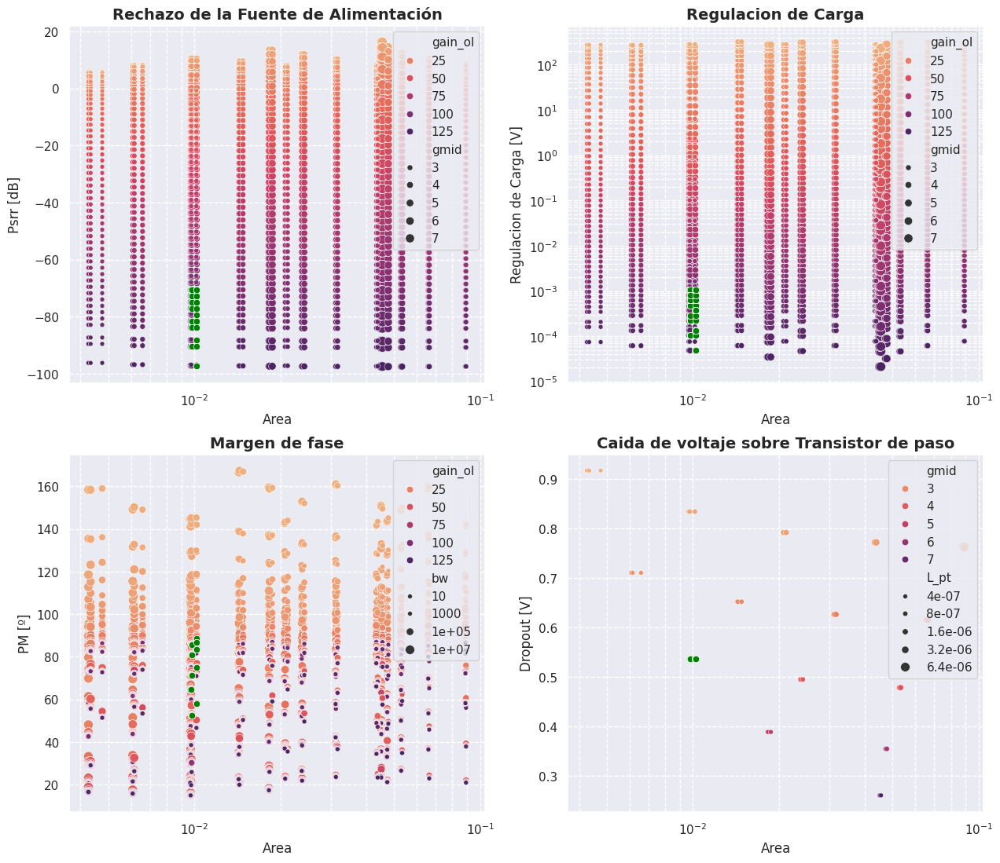

In [99]:
fig, axs = plt.subplots(2, 2, figsize=(15, 13))
sns.scatterplot(ax=axs[0,0], data=ldo_df, x='area', y='psrr', palette='flare', hue='gain_ol', rasterized=True, size='gmid')
sns.scatterplot(ax=axs[0,0], data=ldo_df_new, x='area', y='psrr', c='green')
sns.scatterplot(ax=axs[0,1], data=ldo_df, x='area', y='loadreg', palette='flare', rasterized=True, hue='gain_ol', size='gmid')
sns.scatterplot(ax=axs[0,1], data=ldo_df_new, x='area', y='loadreg', c='green')
sns.scatterplot(ax=axs[1,1], data=ldo_df, x='area', y=Symbol('dropout'), palette='flare', hue='gmid', rasterized=True, size=Symbol('L_pt'))
sns.scatterplot(ax=axs[1,1], data=ldo_df_new, x='area', y=Symbol('dropout'), c='green')
sns.scatterplot(ax=axs[1,0], data=ldo_df, x='area', y="phase_margin_LDO_wc", palette='flare', hue="gain_ol", rasterized=True, size="bw", size_norm=LogNorm(vmin=1e3, vmax=1e7))
sns.scatterplot(ax=axs[1,0], data=ldo_df_new, x='area', y="phase_margin_LDO_wc", c='green')

axs[0,0].set_title(r"Rechazo de la Fuente de Alimentación", fontsize=14, weight='bold')
axs[0,0].set_xlabel(r"Area")
axs[0,0].set_ylabel(r"Psrr [dB]")
axs[0,0].locator_params(axis='x', nbins=10) 
axs[0,0].legend(loc = 'upper right')

axs[0,1].set_title(r"Regulacion de Carga", fontsize=14, weight='bold')
axs[0,1].set_xlabel(r"Area")
axs[0,1].set_ylabel(r"Regulacion de Carga [V]")
axs[0,1].legend(loc = 'upper right')

axs[1,1].set_xlabel(r"Area")
axs[1,1].set_ylabel(r"Dropout [V]")
axs[1,1].set_title(r"Caida de voltaje sobre Transistor de paso", fontsize=14, weight='bold')
axs[1,1].legend(loc = 'upper right')

axs[1,0].set_title(r"Margen de fase", fontsize=14, weight='bold')
axs[1,0].set_xlabel(r"Area")
axs[1,0].set_ylabel(r"PM [º]")
axs[1,0].legend(loc = 'upper right')
#fig.suptitle(r"Ganancias intrínsecas", fontsize=24, y=1.1)

axs[0,0].set_xscale('log')
axs[0,1].set_xscale('log')
axs[1,0].set_xscale('log')
axs[1,1].set_xscale('log')

axs[0,1].set_yscale('log')


axs[0,0].grid(True,which="both",ls="--")  
axs[0,1].grid(True,which="both",ls="--")  
axs[1,0].grid(True,which="both",ls="--")  
axs[1,1].grid(True,which="both",ls="--")  

plt.savefig('ldo_explore_raw.svg', dpi=120)

# OTA exploration (specifications derivation)

In [30]:
OTA_macro.primitives = [Cc_primitive]
OTA_macro.submacromodels = [OTA_1stage_macro, OTA_2stage_macro]
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, rout_OTA, gm_OTA, phase_margin_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OTA_macro
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage_rout
Running MNA... 
   net1  vss  vpos  vout  net2  vr
0     1    0     2     3     4   5
[['vout', 'vr']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f9148202200>, <sstadex.models.macromodel.Macromodel object at 0x7f91482022c0>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f9148202200>, <sstadex.models.macromodel.Macromodel object at 0x7f91482022c0>]
[<sstadex.models.macromodel.Macromodel object at 0x7f9148202200>, <sstadex.models.macromodel.Macromodel object

KeyboardInterrupt: 

In [123]:
ota_df['gain_1stage'] = 20*np.log10(ota_df[Symbol('Ra_1stage')]*ota_df[Symbol('gma_1stage')])
ota_df['gain_2stage'] = 20*np.log10(ota_df[Symbol('Ra_2stage')]*ota_df[Symbol('gma_2stage')])

ota_df["Cin"] = ota_df[Symbol("Cin_2stage")]+ota_df[Symbol("gma_2stage")]*ota_df[Symbol("Ra_2stage")]*ota_df[Symbol("Cc")]

ota_df["bw"] = 1/(2*np.pi*ota_df[Symbol("Ra_1stage")]*(ota_df[Symbol("Cin_2stage")]+ota_df[Symbol("gma_2stage")]*ota_df[Symbol("Ra_2stage")]*ota_df[Symbol("Cc")]))

ota_df["Cc_area"] = ota_df[Symbol("W_cc")]+ota_df[Symbol("L_cc")]
ota_df['gain'] = 20*np.log10(ota_df['gain_OTA'])
ota_df_new = ota_df[(ota_df["gain"]>73.333) & (ota_df["phase_margin_OTA"]>80) & (ota_df["bw"]<1300) & (ota_df["bw"]>1000) & (ota_df["gm_OTA"]>0.000464)]
#ota_df_new = ota_df
ota_df_new.sort_values(by=["gain_1stage", "phase_margin_OTA"] , ascending=True)

,Ra_1stage,gma_1stage,Ra_2stage,gma_2stage,Cin_2stage,Cc,Rc,gain_OTA,rout_OTA,gm_OTA,...,L_cc,W_rc,L_rc,area,gain_1stage,gain_2stage,bw,Cc_area,gain,Cin
35953,2.782559e+03,0.000100,10000000.0,0.001778,1.000000e-11,3.162278e-12,10000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000004,5.000000e-07,0.000096,-11.111111,85.0,1016.947339,0.000092,73.888889,5.624413e-08
35938,2.782559e+03,0.000100,10000000.0,0.001778,5.623413e-13,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.118010,0.000092,73.888889,5.623469e-08
35929,2.782559e+03,0.000100,10000000.0,0.001778,3.162278e-14,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.127609,0.000092,73.888889,5.623416e-08
35920,2.782559e+03,0.000100,10000000.0,0.001778,1.778279e-15,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.128149,0.000092,73.888889,5.623413e-08
35911,2.782559e+03,0.000100,10000000.0,0.001778,1.000000e-16,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.128179,0.000092,73.888889,5.623413e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98431,1.291550e+06,0.004642,100000.0,0.000316,1.778279e-15,3.162278e-12,10000.0,1.895736e+05,1.000000e+05,1.895736,...,0.000046,0.000004,5.000000e-07,0.000096,75.555556,30.0,1232.257011,0.000092,105.555556,1.000018e-10
98422,1.291550e+06,0.004642,100000.0,0.000316,1.000000e-16,3.162278e-12,10000.0,1.895736e+05,1.000000e+05,1.895736,...,0.000046,0.000004,5.000000e-07,0.000096,75.555556,30.0,1232.277691,0.000092,105.555556,1.000001e-10
109761,1.291550e+06,0.010000,100000.0,0.010000,1.000000e-16,1.000000e-13,10000.0,1.291550e+07,1.000000e+05,129.154967,...,0.000008,0.000004,5.000000e-07,0.000021,82.222222,60.0,1232.277691,0.000016,142.222222,1.000001e-10
109681,1.291550e+06,0.010000,100000.0,0.000316,1.778279e-15,3.162278e-12,10000.0,4.084239e+05,1.000000e+05,4.084239,...,0.000046,0.000004,5.000000e-07,0.000096,82.222222,30.0,1232.257011,0.000092,112.222222,1.000018e-10


/tmp/ipykernel_35355/2037025260.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[1,1].legend(loc = 'upper right')


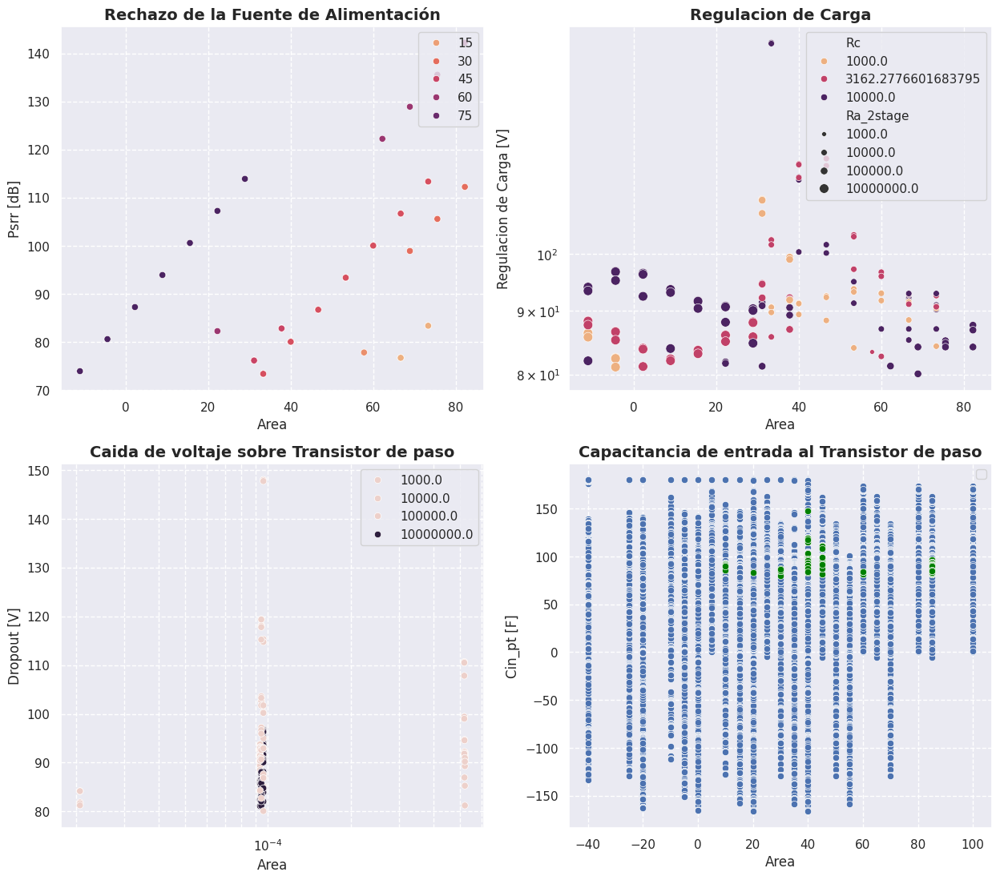

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 13))
sns.scatterplot(ax=axs[0,0], data=ota_df_new, x='gain_1stage', y='gain', palette='flare', hue="gain_2stage")
#sns.scatterplot(ax=axs[0,0], data=ota_df_new, x='gain_1stage', y='gain', c='green')
sns.scatterplot(ax=axs[0,1], data=ota_df_new, x="gain_1stage", y="phase_margin_OTA", hue=Symbol("Rc"), palette='flare', hue_norm=LogNorm(), size=Symbol("Ra_2stage"), size_norm=LogNorm())
#sns.scatterplot(ax=axs[0,1], data=ota_df_new, x='gain_1stage', y='gain_2stage', c='green')
sns.scatterplot(ax=axs[1,0], data=ota_df_new, x="area", y="phase_margin_OTA", hue=Symbol("Ra_2stage"))
#sns.scatterplot(ax=axs[1,0], data=ota_df_new, x='gain_1stage', y="phase_margin_OTA", c='green')
sns.scatterplot(ax=axs[1,1], data=ota_df, x='gain_2stage', y="phase_margin_OTA")
sns.scatterplot(ax=axs[1,1], data=ota_df_new, x='gain_2stage', y="phase_margin_OTA", c='green')

axs[0,0].set_title(r"Rechazo de la Fuente de Alimentación", fontsize=14, weight='bold')
axs[0,0].set_xlabel(r"Area")
axs[0,0].set_ylabel(r"Psrr [dB]")
axs[0,0].locator_params(axis='x', nbins=10) 
axs[0,0].legend(loc = 'upper right')

axs[0,1].set_title(r"Regulacion de Carga", fontsize=14, weight='bold')
axs[0,1].set_xlabel(r"Area")
axs[0,1].set_ylabel(r"Regulacion de Carga [V]")
axs[0,1].legend(loc = 'upper right')

axs[1,0].set_xlabel(r"Area")
axs[1,0].set_ylabel(r"Dropout [V]")
axs[1,0].set_title(r"Caida de voltaje sobre Transistor de paso", fontsize=14, weight='bold')
axs[1,0].legend(loc = 'upper right')

axs[1,1].set_title(r"Capacitancia de entrada al Transistor de paso", fontsize=14, weight='bold')
axs[1,1].set_xlabel(r"Area")
axs[1,1].set_ylabel(r"Cin_pt [F]")
axs[1,1].legend(loc = 'upper right')
#fig.suptitle(r"Ganancias intrínsecas", fontsize=24, y=1.1)
#axs[0,1].set_yscale('log')
#axs[0,1].set_yscale('log')
axs[1,0].set_xscale('log')

axs[0,0].grid(True,which="both",ls="--")  
axs[0,1].grid(True,which="both",ls="--")  
axs[1,0].grid(True,which="both",ls="--")  
axs[1,1].grid(True,which="both",ls="--")  

plt.savefig('ota_explore_raw.svg', dpi=120)

# OTA 1stage exploration (specifications derivation)

## Case 2. No-load

In [45]:
OTA_1stage_macro.primitives = [diffpair_wc, activeload_wc, currentsource]
OTA_1stage_macro.submacromodels = [] 
OTA_1stage_macro.num_level_exp = -1
OTA_1stage_macro.specifications = [gain_1stage_OTA, rout_1stage_OTA, gm_1stage_OTA]
OTA_1stage_macro.opt_specifications = [gain_1stage_OTA]
OTA_1stage_macro.is_primitive = 0
OTA_1stage_macro.run_pareto = True

_, _, _, ota_1stage_df_wc, mask = dfs(OTA_1stage_macro, debug = False)

############################################
Starting the exploration of:  OTA_1stage_macro
Netlist:  ota_1stage
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss
0     1   2     3     4     5    6    0
[('vout', 'vpos')]
Netlist:  ota_1stage_rout
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss  vr
0     1   2     3     4     5    6    0   7
[['vout', 'vr']]
Netlist:  ota_1stage
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss
0     1   2     3     4     5    6    0
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
(-2*Raload_1**2*Rcs*Rdiff_1**2*gaload_1*gdiff_1**2 - 2*Raload_1**2*Rcs*Rdiff_1*gaload_1*gdiff_1 - Raload_1**2*Rdiff_1**2*gaload_1*gdiff_1 - Raload_1**2*Rdiff_1*gdiff_1 - Raload_1*Rcs*Rdiff_1**2*gdiff_1**2 - Raload_1*Rcs*Rdiff_1*gdiff_1 - Raload_1*Rdiff_1**2*gdiff_1)/(2*Raload_1**2*Rcs*Rdiff_1*gaload_1*gdiff_1 + 2*Raload_1**2*Rcs*gaload_1 + Raload_1**2*Rdiff_1*gaload_1 + Raload_1**2 + 2*Raload_1*Rcs*Rdiff_1**2*gaload_

## Case 1. full load

In [46]:
OTA_1stage_macro.ext_mask = mask

OTA_1stage_macro.primitives = [diffpair, activeload, currentsource]
OTA_1stage_macro.submacromodels = [] 
OTA_1stage_macro.num_level_exp = -1
OTA_1stage_macro.specifications = [gain_1stage_OTA, rout_1stage_OTA, gm_1stage_OTA]
OTA_1stage_macro.opt_specifications = [gain_1stage_OTA]
OTA_1stage_macro.is_primitive = 0
OTA_1stage_macro.run_pareto = True

ota_1stage_results, ota_1stage_axes, ota_1stage_primouts, ota_1stage_df, _ = dfs(OTA_1stage_macro, debug = False)

############################################
Starting the exploration of:  ota_1stage
Netlist:  ota_1stage
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss
0     1   2     3     4     5    6    0
[('vout', 'vpos')]
Netlist:  ota_1stage_rout
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss  vr
0     1   2     3     4     5    6    0   7
[['vout', 'vr']]
Netlist:  ota_1stage
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss
0     1   2     3     4     5    6    0
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
(-2*Raload_1**2*Rcs*Rdiff_1**2*gaload_1*gdiff_1**2 - 2*Raload_1**2*Rcs*Rdiff_1*gaload_1*gdiff_1 - Raload_1**2*Rdiff_1**2*gaload_1*gdiff_1 - Raload_1**2*Rdiff_1*gdiff_1 - Raload_1*Rcs*Rdiff_1**2*gdiff_1**2 - Raload_1*Rcs*Rdiff_1*gdiff_1 - Raload_1*Rdiff_1**2*gdiff_1)/(2*Raload_1**2*Rcs*Rdiff_1*gaload_1*gdiff_1 + 2*Raload_1**2*Rcs*gaload_1 + Raload_1**2*Rdiff_1*gaload_1 + Raload_1**2 + 2*Raload_1*Rcs*Rdiff_1**2*gaload_1*gdif

## Filtering

In [47]:
ota_1stage_df_wc.to_csv("data/ota_1stage_df_wc.csv")

In [48]:
ota_1stage_df_wc["gain"] = 20*np.log10(ota_1stage_df_wc["gain_1stage"])
ota_1stage_df_wc

,gdiff_1,Rdiff_1,vs_diff,gaload_1,Raload_1,vout_aload,gcs,Rcs,vs_cs,vgs_cs,...,gm_1stage,W_diff,L_diff,vout_1stage,W_al,L_al,W_cs,L_cs,area,gain
0,0.000480,94106.063659,0.3,0.000076,1.071741e+06,0.688065,0.001035,4.549662e+04,0.3,0.1,...,0.000447,0.000117,4.500000e-07,0.688065,0.000002,4.000000e-07,196.192228,4.500000e-07,196.192349,32.316549
1,0.000480,94106.063659,0.3,0.000076,1.071741e+06,0.688065,0.001097,4.330989e+04,0.3,0.3,...,0.000447,0.000117,4.500000e-07,0.688065,0.000002,4.000000e-07,0.936206,4.500000e-07,0.936327,32.316614
2,0.000480,94106.063659,0.3,0.000076,1.071741e+06,0.688065,0.001119,4.221209e+04,0.3,0.5,...,0.000447,0.000117,4.500000e-07,0.688065,0.000002,4.000000e-07,0.003551,4.500000e-07,0.003672,32.316649
3,0.000480,94106.063659,0.3,0.000076,1.071741e+06,0.688065,0.000622,5.462642e+04,0.3,0.7,...,0.000447,0.000117,4.500000e-07,0.688065,0.000002,4.000000e-07,0.000034,4.500000e-07,0.000155,32.316334
4,0.000480,94106.063659,0.3,0.000076,1.071741e+06,0.688065,0.000279,4.501879e+04,0.3,0.9,...,0.000447,0.000117,4.500000e-07,0.688065,0.000002,4.000000e-07,0.000004,4.500000e-07,0.000125,32.316563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468645,0.000476,241870.967761,0.3,0.000471,1.326292e+05,1.694241,0.001077,1.388865e+06,0.3,0.1,...,0.000470,0.000193,8.000000e-07,1.694241,162.442490,6.400000e-06,544.551200,6.400000e-06,706.993896,32.140333
468646,0.000476,241870.967761,0.3,0.000471,1.326292e+05,1.694241,0.001118,1.925723e+06,0.3,0.3,...,0.000470,0.000193,8.000000e-07,1.694241,162.442490,6.400000e-06,2.231095,6.400000e-06,164.673791,32.140319
468647,0.000476,241870.967761,0.3,0.000471,1.326292e+05,1.694241,0.001015,9.205703e+05,0.3,0.5,...,0.000470,0.000193,8.000000e-07,1.694241,162.442490,6.400000e-06,0.008815,6.400000e-06,162.451512,32.140360
468648,0.000476,241870.967761,0.3,0.000471,1.326292e+05,1.694241,0.000439,4.690966e+05,0.3,0.7,...,0.000470,0.000193,8.000000e-07,1.694241,162.442490,6.400000e-06,0.000268,6.400000e-06,162.442965,32.140435


In [49]:
ota_1stage_df["gain"] = 20*np.log10(ota_1stage_df["gain_1stage"])
ota_1stage_df["gain_wc"] = ota_1stage_df_wc["gain"]
ota_1stage_df = ota_1stage_df.dropna()
ota_1stage_df

,gdiff_1,Rdiff_1,vs_diff,gaload_1,Raload_1,vout_aload,gcs,Rcs,vs_cs,vgs_cs,...,W_diff,L_diff,vout_1stage,W_al,L_al,W_cs,L_cs,area,gain,gain_wc
0,0.000480,94476.716059,0.3,0.000078,1.064113e+06,0.7,0.001035,4.549662e+04,0.3,0.1,...,0.000117,4.500000e-07,0.7,0.000002,4.000000e-07,196.192228,4.500000e-07,196.192349,32.339234,32.316549
1,0.000480,94476.716059,0.3,0.000078,1.064113e+06,0.7,0.001097,4.330989e+04,0.3,0.3,...,0.000117,4.500000e-07,0.7,0.000002,4.000000e-07,0.936206,4.500000e-07,0.936327,32.339298,32.316614
2,0.000480,94476.716059,0.3,0.000078,1.064113e+06,0.7,0.001119,4.221209e+04,0.3,0.5,...,0.000117,4.500000e-07,0.7,0.000002,4.000000e-07,0.003551,4.500000e-07,0.003672,32.339332,32.316649
3,0.000480,94476.716059,0.3,0.000078,1.064113e+06,0.7,0.000622,5.462642e+04,0.3,0.7,...,0.000117,4.500000e-07,0.7,0.000002,4.000000e-07,0.000034,4.500000e-07,0.000155,32.339023,32.316334
4,0.000480,94476.716059,0.3,0.000078,1.064113e+06,0.7,0.000279,4.501879e+04,0.3,0.9,...,0.000117,4.500000e-07,0.7,0.000002,4.000000e-07,0.000004,4.500000e-07,0.000125,32.339248,32.316563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468645,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.001077,1.388865e+06,0.3,0.1,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,544.551200,6.400000e-06,706.993896,40.564151,32.140333
468646,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.001118,1.925723e+06,0.3,0.3,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,2.231095,6.400000e-06,164.673791,40.564151,32.140319
468647,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.001015,9.205703e+05,0.3,0.5,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,0.008815,6.400000e-06,162.451512,40.564152,32.140360
468648,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.000439,4.690966e+05,0.3,0.7,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,0.000268,6.400000e-06,162.442965,40.564155,32.140435


In [50]:
ota_1stage_df.to_csv("data/ota_1stage_df.csv")

In [51]:
ota_1stage_df["gain"] = 20*np.log10(ota_1stage_df["gain_1stage"])
ota_1stage_df_new = ota_1stage_df
#ota_1stage_df_new = ota_1stage_df_new[ota_1stage_df_new[Symbol("vout_aload")]==ota_1stage_df_new[Symbol("vout_1stage")]]
#ota_1stage_df_new.sort_values(by=[Symbol("W_diff"), Symbol("W_al")])

In [52]:
ota_1stage_df_new.sort_values(by=[Symbol("W_diff"), Symbol("W_al")])

,gdiff_1,Rdiff_1,vs_diff,gaload_1,Raload_1,vout_aload,gcs,Rcs,vs_cs,vgs_cs,...,W_diff,L_diff,vout_1stage,W_al,L_al,W_cs,L_cs,area,gain,gain_wc
77500,0.000454,106166.081985,0.3,0.000510,1.757712e+05,1.6,0.001035,4.549662e+04,0.3,0.1,...,0.000075,4.500000e-07,1.6,2.913322,4.000000e-07,196.192228,4.500000e-07,199.105626,29.508795,29.446223
77501,0.000454,106166.081985,0.3,0.000510,1.757712e+05,1.6,0.001097,4.330989e+04,0.3,0.3,...,0.000075,4.500000e-07,1.6,2.913322,4.000000e-07,0.936206,4.500000e-07,3.849604,29.508851,29.446280
77502,0.000454,106166.081985,0.3,0.000510,1.757712e+05,1.6,0.001119,4.221209e+04,0.3,0.5,...,0.000075,4.500000e-07,1.6,2.913322,4.000000e-07,0.003551,4.500000e-07,2.916949,29.508882,29.446311
77503,0.000454,106166.081985,0.3,0.000510,1.757712e+05,1.6,0.000622,5.462642e+04,0.3,0.7,...,0.000075,4.500000e-07,1.6,2.913322,4.000000e-07,0.000034,4.500000e-07,2.913432,29.508609,29.446033
77504,0.000454,106166.081985,0.3,0.000510,1.757712e+05,1.6,0.000279,4.501879e+04,0.3,0.9,...,0.000075,4.500000e-07,1.6,2.913322,4.000000e-07,0.000004,4.500000e-07,2.913402,29.508807,29.446235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468645,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.001077,1.388865e+06,0.3,0.1,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,544.551200,6.400000e-06,706.993896,40.564151,32.140333
468646,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.001118,1.925723e+06,0.3,0.3,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,2.231095,6.400000e-06,164.673791,40.564151,32.140319
468647,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.001015,9.205703e+05,0.3,0.5,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,0.008815,6.400000e-06,162.451512,40.564152,32.140360
468648,0.000477,240022.373756,0.3,0.000483,3.292337e+06,1.6,0.000439,4.690966e+05,0.3,0.7,...,0.000193,8.000000e-07,1.6,162.442490,6.400000e-06,0.000268,6.400000e-06,162.442965,40.564155,32.140435


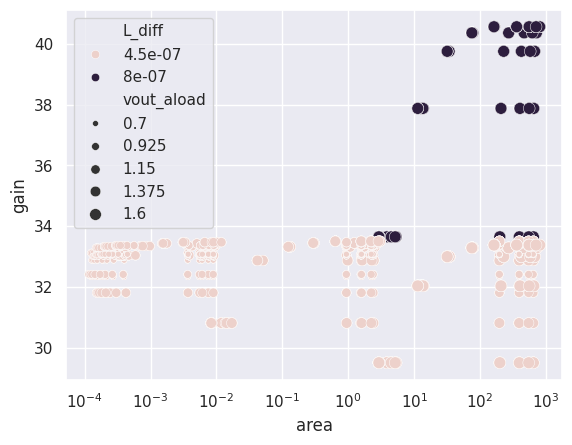

In [53]:
sns.scatterplot(data=ota_1stage_df_new, x="area", y="gain", hue=Symbol("L_diff"), size=Symbol("vout_aload"))
plt.xscale("log")

# OTA 2stage exploration (specifications derivation)

## Case 2. No load

In [54]:
OTA_2stage_macro.primitives = [stage2_t_wc, stage2_cs_wc]
OTA_2stage_macro.submacromodels = [] 
OTA_2stage_macro.num_level_exp = -1
OTA_2stage_macro.specifications = [gain_2stage_OTA, rout_2stage_OTA, gm_2stage_OTA]
OTA_2stage_macro.opt_specifications = [gain_2stage_OTA]
OTA_2stage_macro.is_primitive = 0
OTA_2stage_macro.run_pareto = True

_, _, _, ota_2stage_df_wc, mask = dfs(OTA_2stage_macro, debug = False)

############################################
Starting the exploration of:  OTA_2stage_macro
Netlist:  ota_2stage_v2
Running MNA... 
   vdd  vout  vin  vss
0    1     2    3    0
[('vout', 'vin')]
Netlist:  ota_2stage_rout_v2
Running MNA... 
   vr  vss  vout  vdd  vin
0   1    0     2    3    4
[['vout', 'vr']]
Netlist:  ota_2stage_v2
Running MNA... 
   vdd  vout  vin  vss
0    1     2    3    0
[['vout', 'vin']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Rcs_2stage*Ro_2stage*gm_2stage/(Rcs_2stage + Ro_2stage)
lambdify variables: (gm_2stage, Ro_2stage, Cin_2stage, gcs_2stage, Rcs_2stage, vgs_cs_2stage) <function _lambdifygenerated at 0x7fe01129c160>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([3.84826173e-06, 9.72348562e-06, 2.18344849e-05, 4.65910195e-05,
       9.63495730e-05, 1.18930272e-05, 3.33703839e-05, 7.83376636e-05,
       1.70474533e-04, 3.55502331e-04, 1.05825680e-04, 4.37827309e-04,
       1.20383053e-03, 2.78633656

In [55]:
ota_2stage_df_wc.to_csv("data/ota_2stage_df_wc.csv")

In [56]:
ota_2stage_df_wc["gain"] = 20*np.log10(ota_2stage_df_wc["gain_2stage"])
ota_2stage_df_wc

,gm_2stage,Ro_2stage,Cin_2stage,gcs_2stage,Rcs_2stage,vgs_cs_2stage,gain_2stage,rout_2stage,gm_2stage,W_2stage,L_2stage,vin_2stage,W_cs_2stage,L_cs_2stage,area,gain
0,0.000148,1.368710e+05,4.863899e-15,0.001042,4.767491e+04,0.1,5.236319,3.535875e+04,0.000148,0.000004,4.000000e-07,0.688065,196.192228,4.500000e-07,196.192233,14.380521
1,0.000164,3.926979e+05,2.484628e-14,0.001042,4.767491e+04,0.1,6.963128,4.251360e+04,0.000164,0.000010,8.000000e-07,0.696469,196.192228,4.500000e-07,196.192239,16.856088
2,0.000170,1.091729e+06,1.128026e-13,0.001042,4.767491e+04,0.1,7.782664,4.568009e+04,0.000170,0.000022,1.600000e-06,0.698631,196.192228,4.500000e-07,196.192252,17.822565
3,0.000173,2.153402e+06,4.855141e-13,0.001042,4.767491e+04,0.1,8.074834,4.664228e+04,0.000173,0.000047,3.200000e-06,0.699201,196.192228,4.500000e-07,196.192279,18.142672
4,0.000174,3.314067e+06,2.017963e-12,0.001042,4.767491e+04,0.1,8.192848,4.699880e+04,0.000174,0.000096,6.400000e-06,0.699455,196.192228,4.500000e-07,196.192331,18.268698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3120,0.001020,1.497157e+05,3.238589e-09,0.000104,3.935267e+06,1.4,147.175610,1.442286e+05,0.001020,4.974669,4.000000e-07,1.603031,0.000008,6.400000e-06,4.974684,43.356717
3121,0.000963,6.776478e+05,1.383200e-07,0.000104,3.935267e+06,1.4,556.737854,5.780998e+05,0.000963,21.880875,8.000000e-07,1.665248,0.000008,6.400000e-06,21.880890,54.913015
3122,0.000949,1.589267e+06,1.152730e-06,0.000104,3.935267e+06,1.4,1074.795906,1.132076e+06,0.000949,62.611016,1.600000e-06,1.680479,0.000008,6.400000e-06,62.611032,60.626520
3123,0.000942,1.652397e+06,7.128510e-06,0.000104,3.935267e+06,1.4,1095.719481,1.163746e+06,0.000942,148.964591,3.200000e-06,1.691265,0.000008,6.400000e-06,148.964609,60.793988


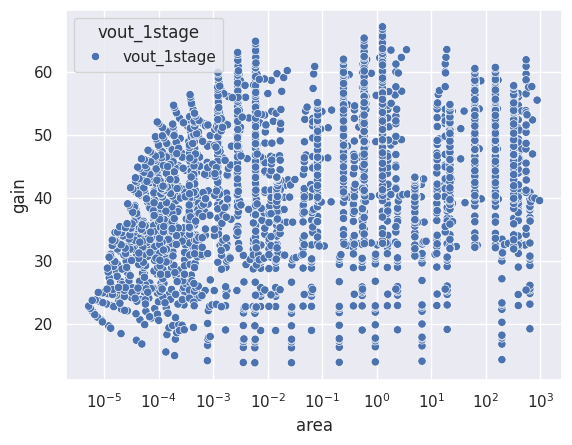

In [57]:
sns.scatterplot(data=ota_2stage_df_wc, x="area", y="gain", hue=Symbol("vout_1stage"))
plt.xscale("log")

In [58]:
OTA_2stage_macro.ext_mask = mask

OTA_2stage_macro.primitives = [stage2_t, stage2_cs]
OTA_2stage_macro.submacromodels = [] 
OTA_2stage_macro.num_level_exp = -1
OTA_2stage_macro.specifications = [gain_2stage_OTA, rout_2stage_OTA, gm_2stage_OTA]
OTA_2stage_macro.opt_specifications = [gain_2stage_OTA]
OTA_2stage_macro.is_primitive = 0
OTA_2stage_macro.run_pareto = True

ota_2stage_results, ota_2stage_axes, ota_2stage_primouts, ota_2stage_df, _ = dfs(OTA_2stage_macro, debug = False)

############################################
Starting the exploration of:  ota_2stage_v2
Netlist:  ota_2stage_v2
Running MNA... 
   vdd  vout  vin  vss
0    1     2    3    0
[('vout', 'vin')]
Netlist:  ota_2stage_rout_v2
Running MNA... 
   vr  vss  vout  vdd  vin
0   1    0     2    3    4
[['vout', 'vr']]
Netlist:  ota_2stage_v2
Running MNA... 
   vdd  vout  vin  vss
0    1     2    3    0
[['vout', 'vin']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Rcs_2stage*Ro_2stage*gm_2stage/(Rcs_2stage + Ro_2stage)
lambdify variables: (gm_2stage, Ro_2stage, Cin_2stage, gcs_2stage, Rcs_2stage, vgs_cs_2stage) <function _lambdifygenerated at 0x7fe011d860e0>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([3.84826173e-06, 9.72348562e-06, 2.18344849e-05, 4.65910195e-05,
       9.63495730e-05, 1.18930272e-05, 3.33703839e-05, 7.83376636e-05,
       1.70474533e-04, 3.55502331e-04, 1.05825680e-04, 4.37827309e-04,
       1.20383053e-03, 2.78633656e-0

In [59]:
ota_2stage_df.to_csv("ota_2stage_df.csv")

In [60]:
ota_2stage_df["gain"] = 20*np.log10(ota_2stage_df["gain_2stage"])
ota_2stage_df["gain_wc"] = 20*np.log10(ota_2stage_df_wc["gain_2stage"])
ota_2stage_df.sort_values(by=Symbol("W_2stage"))

,gm_2stage,Ro_2stage,Cin_2stage,gcs_2stage,Rcs_2stage,vgs_cs_2stage,gain_2stage,rout_2stage,gm_2stage,W_2stage,L_2stage,vin_2stage,W_cs_2stage,L_cs_2stage,area,gain,gain_wc
0,0.000156,5.379091e+05,5.093496e-15,0.001038,4.749849e+04,0.100,6.795533,4.364458e+04,0.000156,0.000004,4.000000e-07,0.7,196.192228,4.500000e-07,196.192233,16.644471,14.380521
3100,0.000156,5.379091e+05,5.093496e-15,0.000103,4.986752e+05,1.400,40.291669,2.587748e+05,0.000156,0.000004,4.000000e-07,0.7,0.000008,6.400000e-06,0.000018,32.104305,25.839847
2800,0.000156,5.379091e+05,5.093496e-15,0.000204,4.560586e+05,1.000,38.428239,2.468069e+05,0.000156,0.000004,4.000000e-07,0.7,0.000008,1.600000e-06,0.000014,31.693010,24.734092
25,0.000156,5.379091e+05,5.093496e-15,0.001099,4.497995e+04,0.300,6.463015,4.150897e+04,0.000156,0.000004,4.000000e-07,0.7,0.936206,4.500000e-07,0.936211,16.208704,14.027948
1900,0.000156,5.379091e+05,5.093496e-15,0.000679,6.504387e+04,0.675,9.034935,5.802723e+04,0.000156,0.000004,4.000000e-07,0.7,0.000044,4.500000e-07,0.000049,19.118501,16.866666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1849,0.000963,5.992004e+06,3.572446e-06,0.000213,1.522917e+06,0.950,1169.666339,1.214294e+06,0.000963,322.754160,6.400000e-06,1.6,0.000040,6.400000e-06,322.754213,61.361240,57.156546
49,0.000963,5.992004e+06,3.572446e-06,0.001099,4.497995e+04,0.300,43.004026,4.464482e+04,0.000963,322.754160,6.400000e-06,1.6,0.936206,4.500000e-07,323.690373,32.670182,32.130067
1824,0.000963,5.992004e+06,3.572446e-06,0.000366,1.208208e+06,0.750,968.515631,1.005469e+06,0.000963,322.754160,6.400000e-06,1.6,0.000161,6.400000e-06,322.754334,59.722133,56.144264
1874,0.000963,5.992004e+06,3.572446e-06,0.000147,1.418320e+06,1.150,1104.707499,1.146857e+06,0.000963,322.754160,6.400000e-06,1.6,0.000017,6.400000e-06,322.754189,60.864946,57.666614


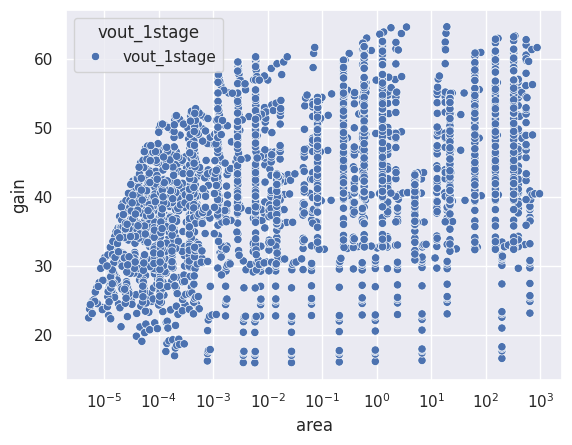

In [61]:
sns.scatterplot(data=ota_2stage_df, x="area", y="gain", hue=Symbol("vout_1stage"))
plt.xscale("log")

# OTA (Going up) 1

In [62]:
ota_1stage_df = pd.read_csv("data/ota_1stage_df.csv")
ota_1stage_df_wc = pd.read_csv("data/ota_1stage_df_wc.csv")

ota_2stage_df = pd.read_csv("data/ota_2stage_df.csv")
ota_2stage_df_wc = pd.read_csv("data/ota_2stage_df_wc.csv")

In [63]:
OTA_2stage_primitive = Primitive(parameters={Symbol("Ra_2stage"): ota_2stage_df["rout_2stage"].values,
                                  Symbol("gma_2stage"): ota_2stage_df["gm_2stage.1"].values,
                                  Symbol("Cin_2stage"): ota_2stage_df["Cin_2stage"].values})
OTA_2stage_primitive.outputs = {
    Symbol("W_2stage"): ota_2stage_df["W_2stage"].values,
    Symbol("L_2stage"): ota_2stage_df["L_2stage"].values,
    Symbol("vin_2stage"): ota_2stage_df["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_2stage_df["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_2stage_df["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_2stage_df["vgs_cs_2stage"].values}

OTA_2stage_primitive_wc = Primitive(parameters={Symbol("Ra_2stage"): ota_2stage_df_wc["rout_2stage"].values,
                                  Symbol("gma_2stage"): ota_2stage_df_wc["gm_2stage.1"].values,
                                  Symbol("Cin_2stage"): ota_2stage_df_wc["Cin_2stage"].values})
OTA_2stage_primitive_wc.outputs = {
    Symbol("W_2stage"): ota_2stage_df_wc["W_2stage"].values,
    Symbol("L_2stage"): ota_2stage_df_wc["L_2stage"].values,
    Symbol("vin_2stage"): ota_2stage_df_wc["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_2stage_df_wc["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_2stage_df_wc["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_2stage_df_wc["vgs_cs_2stage"].values}

In [64]:
OTA_1stage_primitive = Primitive(parameters={
    Symbol("Ra_1stage"): ota_1stage_df["rout_1stage"].values,
    Symbol("gma_1stage"): ota_1stage_df["gm_1stage"].values})
OTA_1stage_primitive.outputs = {
    Symbol("W_diff"): ota_1stage_df["W_diff"].values,
    Symbol("L_diff"): ota_1stage_df["L_diff"].values,
    Symbol("vout_1stage"): ota_1stage_df["vout_1stage"].values,
    Symbol("W_al"): ota_1stage_df["W_al"].values,
    Symbol("L_al"): ota_1stage_df["L_al"].values,
    Symbol("W_cs"): ota_1stage_df["W_cs"].values,
    Symbol("L_cs"): ota_1stage_df["L_cs"].values,
    Symbol("vgs_cs"): ota_1stage_df["vgs_cs"].values}

OTA_1stage_primitive_wc = Primitive(parameters={
    Symbol("Ra_1stage"): ota_1stage_df_wc["rout_1stage"].values,
    Symbol("gma_1stage"): ota_1stage_df_wc["gm_1stage"].values})
OTA_1stage_primitive_wc.outputs = {
    Symbol("W_diff"): ota_1stage_df_wc["W_diff"].values,
    Symbol("L_diff"): ota_1stage_df_wc["L_diff"].values,
    Symbol("vout_1stage"): ota_1stage_df_wc["vout_1stage"].values,
    Symbol("W_al"): ota_1stage_df_wc["W_al"].values,
    Symbol("L_al"): ota_1stage_df_wc["L_al"].values,
    Symbol("W_cs"): ota_1stage_df_wc["W_cs"].values,
    Symbol("L_cs"): ota_1stage_df_wc["L_cs"].values,
    Symbol("vgs_cs"): ota_1stage_df_wc["vgs_cs"].values}

## Case 2. No Load

In [65]:
phase_margin_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("Cin_pt"): Cin_pt_wc}

rout_OTA.parametros = {
    Symbol("Vpos"): 0,
    Symbol("Vr"): 1,
    Symbol("s"): 0,
    Symbol("Rr"): 1000,
    Symbol("Cin_pt"): Cin_pt_wc}

OTA_macro.primitives = [OTA_2stage_primitive_wc, OTA_1stage_primitive_wc, Cc_primitive]
OTA_macro.submacromodels = []
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, rout_OTA, gm_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df_wc, mask = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OTA_macro
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage_rout
Running MNA... 
   net1  vss  vpos  vout  net2  vr
0     1    0     2     3     4   5
[['vout', 'vr']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_2stage, gma_2stage, Cin_2stage, Ra_1stage, gma_1stage, Cc, Rc) <function _lambdifygenerated at 0x7fe011b1a5f0>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([3.84826173e-06, 9.72348562e-06, 2.18344849e-05, ...,
       6.26110163e+01, 1.48964591e+02, 3.22754160e+02]), L_2stage: array([4.0e-07, 8.0e-07, 1.6e-06, ..., 1.6e-06, 3.2e-06, 6.4e-06]), vin_2stage: array([0.68806499, 0

: 

## Case 1. Load

In [59]:
phase_margin_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("Cin_pt"): Cin_pt}

rout_OTA.parametros = {
    Symbol("Vpos"): 0,
    Symbol("Vr"): 1,
    Symbol("s"): 0,
    Symbol("Rr"): 1000,
    Symbol("Cin_pt"): Cin_pt}

OTA_macro.ext_mask = mask

OTA_macro.primitives = [OTA_2stage_primitive, OTA_1stage_primitive, Cc_primitive]
OTA_macro.submacromodels = []
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, rout_OTA, gm_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OpAmp_2stage
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage_rout
Running MNA... 
   net1  vss  vpos  vout  net2  vr
0     1    0     2     3     4   5
[['vout', 'vr']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_2stage, gma_2stage, Cin_2stage, Ra_1stage, gma_1stage, Cc, Rc) <function _lambdifygenerated at 0x7fa152f53490>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([9.72348562e-06, 2.18344849e-05, 4.65910195e-05, 9.63495730e-05,
       1.18930272e-05, 3.33703839e-05, 7.83376636e-05, 1.70474533e-04,
       1.05825680e-04, 9.72348562e-06, 2.18344849e-05, 4.65910195e-05,
       9.63

## Filtering

In [60]:
ota_df_wc["gain"] = 20*np.log10(ota_df_wc["gain_OTA"])
ota_df_wc

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,gm_OTA,...,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain
34344,6.635297e+04,0.000164,2.484628e-14,92443.119589,0.000447,1.000000e-13,1000.00000,449.529266,6.635297e+04,0.006775,...,4.000000e-07,0.000034,4.500000e-07,0.7,0.000008,0.000008,0.000001,5.000000e-07,0.000218,53.055159
34345,6.635297e+04,0.000164,2.484628e-14,92443.119589,0.000447,3.162278e-12,1000.00000,449.529266,6.635297e+04,0.006775,...,4.000000e-07,0.000034,4.500000e-07,0.7,0.000046,0.000046,0.000001,5.000000e-07,0.000293,53.055159
34346,6.635297e+04,0.000164,2.484628e-14,92443.119589,0.000447,1.000000e-10,1000.00000,449.529266,6.635297e+04,0.006775,...,4.000000e-07,0.000034,4.500000e-07,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000718,53.055159
34347,6.635297e+04,0.000164,2.484628e-14,92443.119589,0.000447,1.000000e-13,3162.27766,449.529266,6.635297e+04,0.006775,...,4.000000e-07,0.000034,4.500000e-07,0.7,0.000008,0.000008,0.000002,5.000000e-07,0.000219,53.055159
34348,6.635297e+04,0.000164,2.484628e-14,92443.119589,0.000447,3.162278e-12,3162.27766,449.529266,6.635297e+04,0.006775,...,4.000000e-07,0.000034,4.500000e-07,0.7,0.000046,0.000046,0.000002,5.000000e-07,0.000294,53.055159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1850917,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,3.162278e-12,3162.27766,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,6.400000e-06,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678,86.289369
1850918,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-10,3162.27766,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,6.400000e-06,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,86.289369
1850919,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-13,10000.00000,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,6.400000e-06,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604,86.289369
1850920,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,3.162278e-12,10000.00000,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,6.400000e-06,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680,86.289369


In [61]:
ota_df["gain"] = 20*np.log10(ota_df["gain_OTA"])
ota_df["gain_wc"] = 20*np.log10(ota_df_wc["gain_OTA"])
mask = ota_df["gain"]>73.33
ota_df = ota_df.dropna()[mask]
ota_df

/tmp/ipykernel_38029/3146881436.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ota_df = ota_df.dropna()[mask]


,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,gm_OTA,...,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_wc
64962,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-13,1000.00000,5531.968802,8.020964e+05,0.006897,...,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269,74.857594,67.263659
64963,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,3.162278e-12,1000.00000,5531.968802,8.020964e+05,0.006897,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345,74.857594,67.263659
64964,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-10,1000.00000,5531.968802,8.020964e+05,0.006897,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770,74.857594,67.263659
64965,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-13,3162.27766,5531.968802,8.020964e+05,0.006897,...,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270,74.857594,67.263659
64966,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,3.162278e-12,3162.27766,5531.968802,8.020964e+05,0.006897,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346,74.857594,67.263659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1850917,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,3.162278e-12,3162.27766,17461.167262,1.204005e+06,0.014503,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678,84.841465,86.289369
1850918,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-10,3162.27766,17461.167262,1.204005e+06,0.014503,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,84.841465,86.289369
1850919,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-13,10000.00000,17461.167262,1.204005e+06,0.014503,...,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604,84.841465,86.289369
1850920,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,3.162278e-12,10000.00000,17461.167262,1.204005e+06,0.014503,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680,84.841465,86.289369


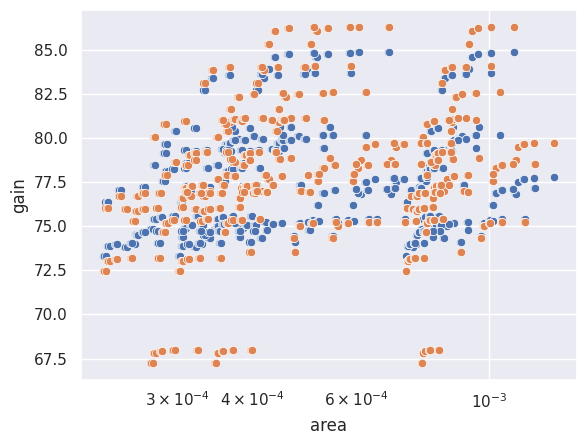

In [66]:
sns.scatterplot(data=ota_df, x="area", y="gain")
sns.scatterplot(data=ota_df_wc, x="area", y="gain")
plt.xscale("log")

In [63]:
ota_df.to_csv("data/ota_df.csv")

In [64]:
ota_df_wc = ota_df_wc[mask]
ota_df_wc

/tmp/ipykernel_38029/469285920.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ota_df_wc = ota_df_wc[mask]


,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,gm_OTA,...,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain
64962,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-13,1000.00000,2307.719153,3.406575e+05,0.006774,...,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269,67.263659
64963,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,3.162278e-12,1000.00000,2307.719153,3.406575e+05,0.006774,...,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345,67.263659
64964,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-10,1000.00000,2307.719153,3.406575e+05,0.006774,...,4.000000e-07,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770,67.263659
64965,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-13,3162.27766,2307.719153,3.406575e+05,0.006774,...,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270,67.263659
64966,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,3.162278e-12,3162.27766,2307.719153,3.406575e+05,0.006774,...,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346,67.263659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1850917,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,3.162278e-12,3162.27766,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678,86.289369
1850918,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-10,3162.27766,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,86.289369
1850919,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-13,10000.00000,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604,86.289369
1850920,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,3.162278e-12,10000.00000,20628.538545,1.424436e+06,0.014482,...,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680,86.289369


In [65]:
ota_df_wc.to_csv("data/ota_df_wc.csv")

## Phase Margin

### Case 2. No-Load

In [124]:
ota_df_wc = pd.read_csv('data/ota_df_wc.csv')  

In [125]:
ota_df_wc

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,...,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain
0,64962,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-13,1000.00000,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269,67.263659
1,64963,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,3.162278e-12,1000.00000,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345,67.263659
2,64964,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-10,1000.00000,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770,67.263659
3,64965,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-13,3162.27766,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270,67.263659
4,64966,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,3.162278e-12,3162.27766,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346,67.263659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,1850917,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,3.162278e-12,3162.27766,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678,86.289369
815,1850918,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-10,3162.27766,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,86.289369
816,1850919,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-13,10000.00000,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604,86.289369
817,1850920,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,3.162278e-12,10000.00000,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680,86.289369


In [114]:
ota_df

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,...,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_wc
0,64962,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-13,1000.00000,5531.968802,8.020964e+05,...,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269,74.857594,67.263659
1,64963,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,3.162278e-12,1000.00000,5531.968802,8.020964e+05,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345,74.857594,67.263659
2,64964,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-10,1000.00000,5531.968802,8.020964e+05,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770,74.857594,67.263659
3,64965,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-13,3162.27766,5531.968802,8.020964e+05,...,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270,74.857594,67.263659
4,64966,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,3.162278e-12,3162.27766,5531.968802,8.020964e+05,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346,74.857594,67.263659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,1850917,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,3.162278e-12,3162.27766,17461.167262,1.204005e+06,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678,84.841465,86.289369
815,1850918,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-10,3162.27766,17461.167262,1.204005e+06,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,84.841465,86.289369
816,1850919,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-13,10000.00000,17461.167262,1.204005e+06,...,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604,84.841465,86.289369
817,1850920,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,3.162278e-12,10000.00000,17461.167262,1.204005e+06,...,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680,84.841465,86.289369


In [113]:
ota_df_wc["Cin_2stage"] = ota_df["Cin_2stage"]
ota_df_wc

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,...,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain
0,64962,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,1.000000e-13,1000.00000,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269,67.263659
1,64963,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,3.162278e-12,1000.00000,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345,67.263659
2,64964,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,1.000000e-10,1000.00000,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770,67.263659
3,64965,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,1.000000e-13,3162.27766,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270,67.263659
4,64966,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,3.162278e-12,3162.27766,2307.719153,3.406575e+05,...,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346,67.263659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,1850917,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,3.162278e-12,3162.27766,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678,86.289369
815,1850918,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,1.000000e-10,3162.27766,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,86.289369
816,1850919,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,1.000000e-13,10000.00000,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604,86.289369
817,1850920,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,3.162278e-12,10000.00000,20628.538545,1.424436e+06,...,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680,86.289369


In [115]:
OTA_2stage_primitive_wc = Primitive(parameters={Symbol("Ra_2stage"): ota_df_wc["Ra_2stage"].values,
                                  Symbol("gma_2stage"): ota_df_wc["gma_2stage"].values,
                                  Symbol("Cin_2stage"): ota_df_wc["Cin_2stage"].values,

                                  Symbol("Ra_1stage"): ota_df_wc["Ra_1stage"].values,
                                  Symbol("gma_1stage"): ota_df_wc["gma_1stage"].values,

                                  Symbol("Cc"): ota_df_wc["Cc"].values,
                                  Symbol("Rc"): ota_df_wc["Rc"].values,})
OTA_2stage_primitive_wc.outputs = {
    Symbol("W_2stage"): ota_df_wc["W_2stage"].values,
    Symbol("L_2stage"): ota_df_wc["L_2stage"].values,
    Symbol("vin_2stage"): ota_df_wc["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_df_wc["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_df_wc["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_df_wc["vgs_cs_2stage"].values,
    
    Symbol("W_diff"): ota_df_wc["W_diff"].values,
    Symbol("L_diff"): ota_df_wc["L_diff"].values,
    Symbol("vout_1stage"): ota_df_wc["vout_1stage"].values,
    Symbol("W_al"): ota_df_wc["W_al"].values,
    Symbol("L_al"): ota_df_wc["L_al"].values,
    Symbol("W_cs"): ota_df_wc["W_cs"].values,
    Symbol("L_cs"): ota_df_wc["L_cs"].values,
    Symbol("vgs_cs"): ota_df_wc["vgs_cs"].values,
    
    Symbol("W_cc"): ota_df_wc["W_cc"].values,
    Symbol("L_cc"): ota_df_wc["L_cc"].values,
    
    Symbol("W_rc"): ota_df_wc["W_rc"].values,
    Symbol("L_rc"): ota_df_wc["L_rc"].values}

In [116]:
phase_margin_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("Cin_pt"): Cin_pt_wc}

rout_OTA.parametros = {
    Symbol("Vpos"): 0,
    Symbol("Vr"): 1,
    Symbol("s"): 0,
    Symbol("Rr"): 1000,
    Symbol("Cin_pt"): Cin_pt_wc}

OTA_macro.ext_mask = None

OTA_macro.primitives = [OTA_2stage_primitive_wc]
OTA_macro.submacromodels = []
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, phase_margin_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df_wc, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OpAmp_2stage
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_2stage, gma_2stage, Cin_2stage, Ra_1stage, gma_1stage, Cc, Rc) <function _lambdifygenerated at 0x7fa152daa5f0>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,


### Case 1. Load

In [117]:
ota_df = pd.read_csv('data/ota_df.csv')

In [118]:
OTA_2stage_primitive = Primitive(parameters={Symbol("Ra_2stage"): ota_df["Ra_2stage"].values,
                                  Symbol("gma_2stage"): ota_df["gma_2stage"].values,
                                  Symbol("Cin_2stage"): ota_df["Cin_2stage"].values,

                                  Symbol("Ra_1stage"): ota_df["Ra_1stage"].values,
                                  Symbol("gma_1stage"): ota_df["gma_1stage"].values,

                                  Symbol("Cc"): ota_df["Cc"].values,
                                  Symbol("Rc"): ota_df["Rc"].values,})
OTA_2stage_primitive.outputs = {
    Symbol("W_2stage"): ota_df["W_2stage"].values,
    Symbol("L_2stage"): ota_df["L_2stage"].values,
    Symbol("vin_2stage"): ota_df["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_df["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_df["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_df["vgs_cs_2stage"].values,
    
    Symbol("W_diff"): ota_df["W_diff"].values,
    Symbol("L_diff"): ota_df["L_diff"].values,
    Symbol("vout_1stage"): ota_df["vout_1stage"].values,
    Symbol("W_al"): ota_df["W_al"].values,
    Symbol("L_al"): ota_df["L_al"].values,
    Symbol("W_cs"): ota_df["W_cs"].values,
    Symbol("L_cs"): ota_df["L_cs"].values,
    Symbol("vgs_cs"): ota_df["vgs_cs"].values,
    
    Symbol("W_cc"): ota_df["W_cc"].values,
    Symbol("L_cc"): ota_df["L_cc"].values,
    
    Symbol("W_rc"): ota_df["W_rc"].values,
    Symbol("L_rc"): ota_df["L_rc"].values}

In [119]:
phase_margin_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("Cin_pt"): Cin_pt}

rout_OTA.parametros = {
    Symbol("Vpos"): 0,
    Symbol("Vr"): 1,
    Symbol("s"): 0,
    Symbol("Rr"): 1000,
    Symbol("Cin_pt"): Cin_pt}

OTA_macro.ext_mask = None

OTA_macro.primitives = [OTA_2stage_primitive]
OTA_macro.submacromodels = []
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, phase_margin_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OpAmp_2stage
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_2stage, gma_2stage, Cin_2stage, Ra_1stage, gma_1stage, Cc, Rc) <function _lambdifygenerated at 0x7fa14e16b880>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,


In [120]:
ota_df_wc

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,phase_margin_OTA,W_2stage,...,W_al,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area
0,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,1.000000e-13,1000.00000,2307.719153,-0.634780,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269
1,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,3.162278e-12,1000.00000,2307.719153,-45.302460,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345
2,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,1.000000e-10,1000.00000,2307.719153,-61.019639,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770
3,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,1.000000e-13,3162.27766,2307.719153,4.081643,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270
4,3.406575e+05,0.000164,3.295131e-14,92516.301903,0.000447,3.162278e-12,3162.27766,2307.719153,-9.465588,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,3.162278e-12,3162.27766,20628.538545,23.016228,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678
815,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,1.000000e-10,3162.27766,20628.538545,85.070792,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103
816,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,1.000000e-13,10000.00000,20628.538545,1.087739,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604
817,1.424436e+06,0.000311,2.720098e-12,101394.086043,0.000460,3.162278e-12,10000.00000,20628.538545,36.600179,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680


In [121]:
ota_df

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,phase_margin_OTA,W_2stage,...,W_al,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area
0,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-13,1000.00000,5531.968802,24.428733,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000269
1,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,3.162278e-12,1000.00000,5531.968802,-9.532934,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000001,5.000000e-07,0.000345
2,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-10,1000.00000,5531.968802,-53.820246,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000770
3,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-13,3162.27766,5531.968802,25.582618,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000270
4,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,3.162278e-12,3162.27766,5531.968802,2.607208,0.00001,...,0.000002,4.000000e-07,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
814,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,3.162278e-12,3162.27766,17461.167262,7.760578,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000678
815,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-10,3162.27766,17461.167262,71.203409,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103
816,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-13,10000.00000,17461.167262,3.874893,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000604
817,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,3.162278e-12,10000.00000,17461.167262,25.630451,0.00017,...,0.000178,6.400000e-06,0.000054,0.000006,0.9,0.000046,0.000046,0.000004,5.000000e-07,0.000680


In [122]:
ota_df["gain"] = 20*np.log10(ota_df["gain_OTA"])
ota_df["gain_wc"] = 20*np.log10(ota_df_wc["gain_OTA"])
ota_df["phase_margin_OTA_bc"] = ota_df["phase_margin_OTA"]
ota_df["phase_margin_OTA_wc"] = ota_df_wc["phase_margin_OTA"]

ota_df_wc["gain"] = 20*np.log10(ota_df_wc["gain_OTA"])

mask = ota_df["phase_margin_OTA"]>60
ota_df = ota_df[mask]
ota_df_wc = ota_df_wc[mask]
ota_df

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,phase_margin_OTA,W_2stage,...,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_wc,phase_margin_OTA_bc,phase_margin_OTA_wc
8,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-10,10000.00000,5531.968802,113.287022,0.000010,...,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000772,74.857594,67.263659,113.287022,125.361748
17,6.543117e+05,0.000171,1.829304e-13,92541.862203,0.000447,1.000000e-10,10000.00000,4640.575973,112.525888,0.000022,...,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000727,73.331438,72.456526,112.525888,112.561101
26,1.064379e+06,0.000171,1.829304e-13,92553.217653,0.000447,1.000000e-10,10000.00000,7548.809966,112.430592,0.000022,...,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000785,77.557570,74.651788,112.430592,112.497845
35,6.977247e+05,0.000174,8.677518e-13,92541.862203,0.000447,1.000000e-10,10000.00000,5013.589857,107.595340,0.000047,...,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000754,74.002976,75.315499,107.595340,85.364594
44,1.184243e+06,0.000174,8.677518e-13,92553.217653,0.000447,1.000000e-10,10000.00000,8509.430158,107.502050,0.000047,...,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000811,78.598010,78.481038,107.502050,85.287582
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800,5.334497e+05,0.000311,2.720098e-12,101407.101834,0.000460,1.000000e-10,10000.00000,7736.383924,65.071632,0.000170,...,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.001288,77.770760,79.718445,65.071632,44.692698
806,7.045380e+05,0.000311,2.720098e-12,101389.387184,0.000460,1.000000e-10,3162.27766,10217.612633,71.234179,0.000170,...,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001045,80.186989,82.569797,71.234179,85.074172
809,7.045380e+05,0.000311,2.720098e-12,101389.387184,0.000460,1.000000e-10,10000.00000,10217.612633,65.034858,0.000170,...,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.001047,80.186989,82.569797,65.034858,44.603963
815,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-10,3162.27766,17461.167262,71.203409,0.000170,...,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,84.841465,86.289369,71.203409,85.070792


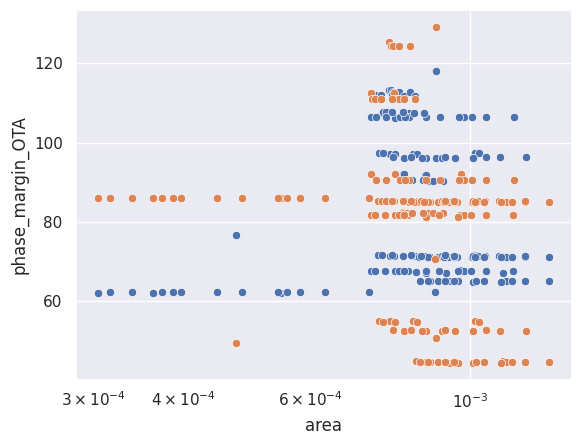

In [123]:
sns.scatterplot(data=ota_df[ota_df["phase_margin_OTA"]>60], x="area", y="phase_margin_OTA")
sns.scatterplot(data=ota_df_wc[ota_df["phase_margin_OTA"]>60], x="area", y="phase_margin_OTA")
plt.xscale("log")

## Simulation

In [46]:
Cin_pt

2.026e-11

In [50]:
W_diff = ota_df[Symbol("W_diff")].values*1e6
L_diff = ota_df[Symbol("L_diff")].values*1e6

W_al = ota_df[Symbol("W_al")].values*1e6
L_al = ota_df[Symbol("L_al")].values*1e6

W_cs = ota_df[Symbol("W_cs")].values*1e6
L_cs = ota_df[Symbol("L_cs")].values*1e6

W_2stage = ota_df[Symbol("W_2stage")].values*1e6
L_2stage = ota_df[Symbol("L_2stage")].values*1e6

Cc = ota_df[Symbol("Cc")].values
Rc = ota_df[Symbol("Rc")].values

mult_diff = []
for idx, i in enumerate(W_diff):
    if i>100:
        mult_diff.append(10)
    else:
        mult_diff.append(1)

mult_al = []
for idx, i in enumerate(W_al):
    if i>100:
        mult_al.append(10)
    else:
        mult_al.append(1)

values = {
    "XM1": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM2": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM3": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM4": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM5": [
        W_2stage,
        L_2stage,
        mult_diff,
        "nfet",
    ],
    "XM6": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM7": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM8": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "I2": np.full(len(W_diff), I_amp2),
    "Cc": Cc,
    "Rc": Rc, 
    "C3": np.full(len(W_diff), Cin_pt),
    "R2": np.full(len(W_diff), -42857142857),
}

simulation_results = spice_sim("ota_2stage_tb", values)

[array([117.06683064, 117.06683064, 117.06683064, 117.06683064,
       117.06683064, 117.06683064, 117.06683064, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
        93.18145421,  93.18145421,  93.18145421,  93.18145421,
       117.06683064, 117.06683064, 117.06683064, 117.06683064,
       117.06683064, 117.06683064, 117.06683064, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.2

Note: Dynamic gmin stepping completed

Note: No compatibility mode selected!


Circuit: ** sch_path: /workspaces/usm-vlsi-tools/shared_xserver/sstadex/test/tesis_notebooks/xschem/ota_2stage_tb.sch

Doing analysis at TEMP = 27.000000 and TNOM = 27.000000

 Reference value :  1.00000e+00
No. of Data Rows : 91
Note: Simulation executed from .control section 
test numer:  1
** sch_path: /workspaces/usm-vlsi-tools/shared_xserver/SSTADEx/test/Tesis_notebooks/xschem/ota_2stage_tb.sch

**.subckt ota_2stage_tb

XM1
['XM1', 'vout_s1', 'vn', 'vs', 'vs', 'sg13_hv_nmos', 'L=0.44999999999999996u', 'W=117.0668306444u', 'ng=1', 'm=1']
XM1 vout_s1 vn vs vs sg13_hv_nmos L=0.44999999999999996u W=117.0668306444u ng=1 m=1 

XM2
['XM2', 'net2', 'net1', 'vs', 'vs', 'sg13_hv_nmos', 'L=0.44999999999999996u', 'W=117.0668306444u', 'ng=1', 'm=1']
XM2 net2 net1 vs vs sg13_hv_nmos L=0.44999999999999996u W=117.0668306444u ng=1 m=1 

XM3
['XM3', 'vout_s1', 'net2', 'vdd', 'vdd', 'sg13_hv_pmos', 'L=0.39999999999999997u

In [51]:
gain_error = []

for df in simulation_results:
    gain_error.append(float(df.columns[1]))

ota_df["gain_sim"]=gain_error
ota_df["gain_error"] = (np.abs(np.asarray(gain_error) - ota_df["gain"].values)/np.asarray(gain_error))*100

sim_pm = []

for sim in simulation_results:
    gain = np.abs(sim.iloc[:,1])
    fc_arg = np.argmin(gain)
    phase = sim.iloc[fc_arg,3]
    sim_pm.append(phase*180/np.pi)

In [52]:
ota_df["pm_sim"]=sim_pm
ota_df["pm_error"]=(np.abs(ota_df["phase_margin_OTA"].values-sim_pm)/np.abs(sim_pm))*100
ota_df

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,phase_margin_OTA,W_2stage,...,L_rc,area,gain,gain_wc,phase_margin_OTA_wc,phase_margin_OTA_bc,gain_sim,gain_error,pm_sim,pm_error
8,8.020964e+05,0.000167,3.295131e-14,92553.217653,0.000447,1.000000e-10,10000.00000,5531.968802,113.287022,0.000010,...,5.000000e-07,0.000772,74.857594,67.263659,125.788914,113.287022,74.927299,0.093029,114.144438,0.751167
17,6.543117e+05,0.000171,1.829304e-13,92541.862203,0.000447,1.000000e-10,10000.00000,4640.575973,112.525888,0.000022,...,5.000000e-07,0.000727,73.331438,72.456526,117.020693,112.525888,73.340313,0.012101,110.537456,1.798876
26,1.064379e+06,0.000171,1.829304e-13,92553.217653,0.000447,1.000000e-10,10000.00000,7548.809966,112.430592,0.000022,...,5.000000e-07,0.000785,77.557570,74.651788,116.958418,112.430592,77.611539,0.069537,110.532503,1.717223
35,6.977247e+05,0.000174,8.677518e-13,92541.862203,0.000447,1.000000e-10,10000.00000,5013.589857,107.595340,0.000047,...,5.000000e-07,0.000754,74.002976,75.315499,94.394865,107.595340,73.995437,0.010188,107.628951,0.031228
44,1.184243e+06,0.000174,8.677518e-13,92553.217653,0.000447,1.000000e-10,10000.00000,8509.430158,107.502050,0.000047,...,5.000000e-07,0.000811,78.598010,78.481038,94.326414,107.502050,78.641306,0.055055,107.627087,0.116176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800,5.334497e+05,0.000311,2.720098e-12,101407.101834,0.000460,1.000000e-10,10000.00000,7736.383924,65.071632,0.000170,...,5.000000e-07,0.001288,77.770760,79.718445,43.474755,65.071632,77.894101,0.158344,55.902575,16.401851
806,7.045380e+05,0.000311,2.720098e-12,101389.387184,0.000460,1.000000e-10,3162.27766,10217.612633,71.234179,0.000170,...,5.000000e-07,0.001045,80.186989,82.569797,85.902632,71.234179,80.225038,0.047428,67.408007,5.676138
809,7.045380e+05,0.000311,2.720098e-12,101389.387184,0.000460,1.000000e-10,10000.00000,10217.612633,65.034858,0.000170,...,5.000000e-07,0.001047,80.186989,82.569797,43.401177,65.034858,80.225037,0.047427,55.629636,16.906854
815,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-10,3162.27766,17461.167262,71.203409,0.000170,...,5.000000e-07,0.001103,84.841465,86.289369,85.899343,71.203409,84.933359,0.108195,67.538698,5.426091


In [227]:
1.8+vout_2stage_wc

1.226

In [105]:
Cin_pt_wc

1.741429e-12

In [102]:
W_diff = ota_df_wc[Symbol("W_diff")].values*1e6
L_diff = ota_df_wc[Symbol("L_diff")].values*1e6

W_al = ota_df_wc[Symbol("W_al")].values*1e6
L_al = ota_df_wc[Symbol("L_al")].values*1e6

W_cs = ota_df_wc[Symbol("W_cs")].values*1e6
L_cs = ota_df_wc[Symbol("L_cs")].values*1e6

W_2stage = ota_df_wc[Symbol("W_2stage")].values*1e6
L_2stage = ota_df_wc[Symbol("L_2stage")].values*1e6

Cc = ota_df_wc[Symbol("Cc")].values
Rc = ota_df_wc[Symbol("Rc")].values

mult_diff = []
for idx, i in enumerate(W_diff):
    if i>100:
        mult_diff.append(10)
    else:
        mult_diff.append(1)

mult_al = []
for idx, i in enumerate(W_al):
    if i>100:
        mult_al.append(10)
    else:
        mult_al.append(1)

values = {
    "XM1": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM2": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM3": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM4": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM5": [
        W_2stage,
        L_2stage,
        mult_diff,
        "nfet",
    ],
    "XM6": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM7": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM8": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "I2": np.full(len(W_diff), I_amp2),
    "Cc": Cc,
    "Rc": Rc, 
    "C3": np.full(len(W_diff), Cin_pt_wc),
    "R2": np.full(len(W_diff), 27607361963)
}

simulation_results = spice_sim("ota_2stage_tb", values)

[array([117.06683064, 117.06683064, 117.06683064, 117.06683064,
       117.06683064, 117.06683064, 117.06683064, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
        93.18145421,  93.18145421,  93.18145421,  93.18145421,
       117.06683064, 117.06683064, 117.06683064, 117.06683064,
       117.06683064, 117.06683064, 117.06683064, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.2

In [103]:
gain_error = []

for df in simulation_results:
    gain_error.append(float(df.columns[1]))

ota_df_wc["gain_sim"]=gain_error
ota_df_wc["gain_error"] = (np.abs(np.asarray(gain_error) - ota_df_wc["gain"].values)/np.asarray(gain_error))*100

sim_pm = []

for sim in simulation_results:
    gain = np.abs(sim.iloc[:,1])
    fc_arg = np.argmin(gain)
    phase = sim.iloc[fc_arg,3]
    sim_pm.append(phase*180/np.pi)

/tmp/ipykernel_38029/3984084931.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ota_df_wc["gain_sim"]=gain_error
/tmp/ipykernel_38029/3984084931.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ota_df_wc["gain_error"] = (np.abs(np.asarray(gain_error) - ota_df_wc["gain"].values)/np.asarray(gain_error))*100


In [104]:
ota_df_wc["pm_sim"]=sim_pm
ota_df_wc["pm_error"]=(np.abs(ota_df_wc["phase_margin_OTA"].values-sim_pm)/np.abs(sim_pm))*100
ota_df_wc

/tmp/ipykernel_38029/4261733603.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ota_df_wc["pm_sim"]=sim_pm
/tmp/ipykernel_38029/4261733603.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ota_df_wc["pm_error"]=(np.abs(ota_df_wc["phase_margin_OTA"].values-sim_pm)/np.abs(sim_pm))*100


,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,phase_margin_OTA,W_2stage,...,W_cc,L_cc,W_rc,L_rc,area,gain,gain_sim,gain_error,pm_sim,pm_error
8,3.406575e+05,0.000164,2.484628e-14,92516.301903,0.000447,1.000000e-10,10000.00000,2307.719153,125.788914,0.000010,...,0.000258,0.000258,0.000004,5.000000e-07,0.000772,67.263659,67.542741,0.413193,113.846738,10.489695
17,5.951471e+05,0.000170,1.128026e-13,92528.925725,0.000447,1.000000e-10,10000.00000,4195.911427,117.020693,0.000022,...,0.000258,0.000258,0.000004,5.000000e-07,0.000727,72.456526,72.476439,0.027475,106.564202,9.812386
26,7.662888e+05,0.000170,1.128026e-13,92540.315271,0.000447,1.000000e-10,10000.00000,5402.432990,116.958418,0.000022,...,0.000258,0.000258,0.000004,5.000000e-07,0.000785,74.651788,74.765392,0.151948,106.444914,9.876943
35,8.138947e+05,0.000173,4.855141e-13,92534.585948,0.000447,1.000000e-10,10000.00000,5831.428525,94.394865,0.000047,...,0.000258,0.000258,0.000004,5.000000e-07,0.000754,75.315499,75.251292,0.085324,73.690262,28.096797
44,1.171791e+06,0.000173,4.855141e-13,92545.961305,0.000447,1.000000e-10,10000.00000,8395.603510,94.326414,0.000047,...,0.000258,0.000258,0.000004,5.000000e-07,0.000811,78.481038,78.504077,0.029347,73.755191,27.891220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800,6.684931e+05,0.000311,1.673833e-12,101405.946184,0.000459,1.000000e-10,10000.00000,9681.045011,43.474755,0.000170,...,0.000258,0.000258,0.000004,5.000000e-07,0.001288,79.718445,79.716302,0.002688,27.893790,55.858186
806,9.282480e+05,0.000311,1.673833e-12,101388.209353,0.000460,1.000000e-10,3162.27766,13442.802941,85.902632,0.000170,...,0.000258,0.000258,0.000002,5.000000e-07,0.001045,82.569797,82.522750,0.057011,81.196158,5.796424
809,9.282480e+05,0.000311,1.673833e-12,101388.209353,0.000460,1.000000e-10,10000.00000,13442.802941,43.401177,0.000170,...,0.000258,0.000258,0.000004,5.000000e-07,0.001047,82.569797,82.522749,0.057012,29.509122,47.077157
815,1.424436e+06,0.000311,1.673833e-12,101394.086043,0.000460,1.000000e-10,3162.27766,20628.538545,85.899343,0.000170,...,0.000258,0.000258,0.000002,5.000000e-07,0.001103,86.289369,86.314152,0.028712,81.063214,5.965874


In [233]:
Cin_pt_wc

1.741429e-12

# LDO (Going up) 1

In [55]:
ota_df = pd.read_csv("data/ota_df.csv")
ota_df_wc = pd.read_csv("data/ota_df_wc.csv")

In [61]:
OTA_primitive = Primitive(parameters={Symbol("Ra"): ota_df["rout_OTA"].values,
                                  Symbol("gma"): ota_df["gm_OTA"].values})
OTA_primitive.outputs = {
    Symbol("W_2stage"): ota_df["W_2stage"].values,
    Symbol("L_2stage"): ota_df["L_2stage"].values,
    Symbol("vin_2stage"): ota_df["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_df["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_df["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_df["vgs_cs_2stage"].values,
    
    Symbol("W_diff"): ota_df["W_diff"].values,
    Symbol("L_diff"): ota_df["L_diff"].values,
    Symbol("vout_1stage"): ota_df["vout_1stage"].values,
    Symbol("W_al"): ota_df["W_al"].values,
    Symbol("L_al"): ota_df["L_al"].values,
    Symbol("W_cs"): ota_df["W_cs"].values,
    Symbol("L_cs"): ota_df["L_cs"].values,
    Symbol("vgs_cs"): ota_df["vgs_cs"].values}

OTA_primitive_wc = Primitive(parameters={Symbol("Ra"): ota_df_wc["rout_OTA"].values,
                                  Symbol("gma"): ota_df_wc["gm_OTA"].values})
OTA_primitive_wc.outputs = {
    Symbol("W_2stage"): ota_df_wc["W_2stage"].values,
    Symbol("L_2stage"): ota_df_wc["L_2stage"].values,
    Symbol("vin_2stage"): ota_df_wc["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_df_wc["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_df_wc["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_df_wc["vgs_cs_2stage"].values,
    
    Symbol("W_diff"): ota_df_wc["W_diff"].values,
    Symbol("L_diff"): ota_df_wc["L_diff"].values,
    Symbol("vout_1stage"): ota_df_wc["vout_1stage"].values,
    Symbol("W_al"): ota_df_wc["W_al"].values,
    Symbol("L_al"): ota_df_wc["L_al"].values,
    Symbol("W_cs"): ota_df_wc["W_cs"].values,
    Symbol("L_cs"): ota_df_wc["L_cs"].values,
    Symbol("vgs_cs"): ota_df_wc["vgs_cs"].values}

In [ ]:
LDO_macro.primitives = [OTA_primitive_wc, pt, Cc_primitive]
LDO_macro.submacromodels = []
LDO_macro.num_level_exp = 1
LDO_macro.specifications = [psrr_LDO_macro]
LDO_macro.opt_specifications = [psrr_LDO_macro]
LDO_macro.is_primitive = 0
LDO_macro.run_pareto = False

_, _, _, ldo_df_wc, _ = dfs(LDO_macro, debug = False)

############################################
Starting the exploration of:  ldo
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
(15737.7049180328*Ro_pt*gm_pt + 15737.7049180328)/(11803.2786885246*Ra*Ro_pt*gm_pt*gma + 1323.47540983606*Ro_pt + 15737.7049180328)
lambdify variables: (Ra, gma, gm_pt, Ro_pt, Cgg_pt, Cgd_pt, Cin_pt, dropout, vout_2stage, Cc, Rc) <function _lambdifygenerated at 0x7f4190d2ac20>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.183448

In [63]:
LDO_macro.primitives = [OTA_primitive, pt, Cc_primitive]
LDO_macro.submacromodels = []
LDO_macro.num_level_exp = 1
LDO_macro.specifications = [psrr_LDO_macro]
LDO_macro.opt_specifications = [psrr_LDO_macro]
LDO_macro.is_primitive = 0
LDO_macro.run_pareto = False

_, _, _, ldo_df, _ = dfs(LDO_macro, debug = False)

############################################
Starting the exploration of:  ldo
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
(15737.7049180328*Ro_pt*gm_pt + 15737.7049180328)/(11803.2786885246*Ra*Ro_pt*gm_pt*gma + 1323.47540983606*Ro_pt + 15737.7049180328)
lambdify variables: (Ra, gma, gm_pt, Ro_pt, Cgg_pt, Cgd_pt, Cin_pt, dropout, vout_2stage, Cc, Rc) <function _lambdifygenerated at 0x7f4190d2a8c0>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.183448

In [68]:
ldo_df["psrr"] = 20*np.log10(ldo_df["psrr_LDO"])
ldo_df["psrr_wc"] = 20*np.log10(ldo_df_wc["psrr_LDO"])
ldo_df = ldo_df[(ldo_df[Symbol("W_pt")]<10e-3) & (ldo_df[Symbol("dropout")]<0.6)]
ldo_df

/tmp/ipykernel_635/3196295449.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ldo_df["psrr"] = 20*np.log10(ldo_df["psrr_LDO"])
/tmp/ipykernel_635/3196295449.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ldo_df["psrr_wc"] = 20*np.log10(ldo_df_wc["psrr_LDO"])


,Ra,gma,gm_pt,Ro_pt,Cgg_pt,Cgd_pt,Cin_pt,dropout,vout_2stage,Cc,...,vgs_cs,W_pt,L_pt,W_cc,L_cc,W_rc,L_rc,area,psrr,psrr_wc
29484,8.020964e+05,0.006897,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,1.000000e-13,...,0.9,0.009689,4.000000e-07,0.000008,0.000008,0.000001,5.000000e-07,0.009959,-71.996934,-71.996934
29485,8.020964e+05,0.006897,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,3.162278e-12,...,0.9,0.009689,4.000000e-07,0.000046,0.000046,0.000001,5.000000e-07,0.010034,-71.996934,-71.996934
29486,8.020964e+05,0.006897,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,1.000000e-10,...,0.9,0.009689,4.000000e-07,0.000258,0.000258,0.000001,5.000000e-07,0.010459,-71.996934,-71.996934
29487,8.020964e+05,0.006897,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,1.000000e-13,...,0.9,0.009689,4.000000e-07,0.000008,0.000008,0.000002,5.000000e-07,0.009960,-71.996934,-71.996934
29488,8.020964e+05,0.006897,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,3.162278e-12,...,0.9,0.009689,4.000000e-07,0.000046,0.000046,0.000002,5.000000e-07,0.010035,-71.996934,-71.996934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36850,1.204005e+06,0.014503,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,3.162278e-12,...,0.9,0.009689,4.000000e-07,0.000046,0.000046,0.000002,5.000000e-07,0.010367,-81.980424,-81.980424
36851,1.204005e+06,0.014503,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,1.000000e-10,...,0.9,0.009689,4.000000e-07,0.000258,0.000258,0.000002,5.000000e-07,0.010792,-81.980424,-81.980424
36852,1.204005e+06,0.014503,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,1.000000e-13,...,0.9,0.009689,4.000000e-07,0.000008,0.000008,0.000004,5.000000e-07,0.010294,-81.980424,-81.980424
36853,1.204005e+06,0.014503,0.375932,62.42697,1.217512e-11,3.444604e-13,2.025901e-11,0.53688,-1.111111,3.162278e-12,...,0.9,0.009689,4.000000e-07,0.000046,0.000046,0.000004,5.000000e-07,0.010369,-81.980424,-81.980424


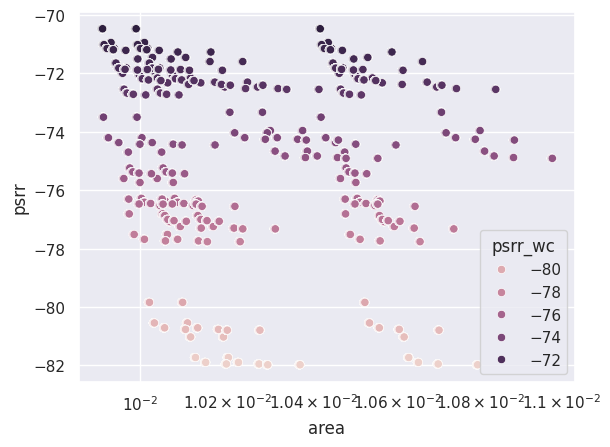

In [71]:
sns.scatterplot(data=ldo_df, x="area", y="psrr", hue="psrr_wc")
plt.xscale("log")

# OTA (Going up)

In [23]:
print(OTA_2stage_macro)
print(OTA_1stage_macro)

In [30]:
OTA_2stage_macro.primitives = [stage2_t_wc, stage2_cs_wc]
OTA_2stage_macro.submacromodels = [] 
OTA_2stage_macro.num_level_exp = -1
OTA_2stage_macro.specifications = [gain_2stage_OTA, rout_2stage_OTA, gm_2stage_OTA]
OTA_2stage_macro.opt_specifications = [gain_2stage_OTA]
OTA_2stage_macro.is_primitive = 0
OTA_2stage_macro.run_pareto = True

OTA_1stage_macro.primitives = [diffpair_wc, activeload_wc, currentsource]
OTA_1stage_macro.submacromodels = [] 
OTA_1stage_macro.num_level_exp = -1
OTA_1stage_macro.specifications = [gain_1stage_OTA, rout_1stage_OTA, gm_1stage_OTA]
OTA_1stage_macro.opt_specifications = [gain_1stage_OTA]
OTA_1stage_macro.is_primitive = 0
OTA_1stage_macro.run_pareto = True

OTA_macro.primitives = [Cc_primitive]
OTA_macro.submacromodels = [OTA_1stage_macro, OTA_2stage_macro]
OTA_macro.num_level_exp = -1
OTA_macro.specifications = [gain_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df_wc, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OTA_macro
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7fa4d60443d0>, <sstadex.models.macromodel.Macromodel object at 0x7fa4d6045c30>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7fa4d60443d0>, <sstadex.models.macromodel.Macromodel object at 0x7fa4d6045c30>]
[<sstadex.models.macromodel.Macromodel object at 0x7fa4d60443d0>, <sstadex.models.macromodel.Macromodel object at 0x7fa4d6045c30>]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_1stage, gma_1stage, Ra_2stage, gma_2stage, Cin_2stage, Cc, Rc) <function _lambdifygenerated at 0x7fa4d5db2dd0>
#### creating the primods_list ####
12500
finished for operation
starting the return
finished explore operation
evaluation shape:  (112500,)
abs done
[[8.16496581e-

In [32]:
ota_df_wc.to_csv("ota_df_wc" + ".csv")

In [24]:
OTA_2stage_macro.primitives = [stage2_t, stage2_cs]
OTA_2stage_macro.submacromodels = [] 
OTA_2stage_macro.num_level_exp = -1
OTA_2stage_macro.specifications = [gain_2stage_OTA, rout_2stage_OTA, gm_2stage_OTA]
OTA_2stage_macro.opt_specifications = [gain_2stage_OTA]
OTA_2stage_macro.is_primitive = 0
OTA_2stage_macro.run_pareto = True

OTA_1stage_macro.primitives = [diffpair, activeload, currentsource]
OTA_1stage_macro.submacromodels = [] 
OTA_1stage_macro.num_level_exp = -1
OTA_1stage_macro.specifications = [gain_1stage_OTA, rout_1stage_OTA, gm_1stage_OTA]
OTA_1stage_macro.opt_specifications = [gain_1stage_OTA]
OTA_1stage_macro.is_primitive = 0
OTA_1stage_macro.run_pareto = True

OTA_macro.primitives = [Cc_primitive]
OTA_macro.submacromodels = [OTA_1stage_macro, OTA_2stage_macro]
OTA_macro.num_level_exp = -1
OTA_macro.specifications = [gain_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OTA_macro
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f4e69400670>, <sstadex.models.macromodel.Macromodel object at 0x7f4e694008e0>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f4e69400670>, <sstadex.models.macromodel.Macromodel object at 0x7f4e694008e0>]
[<sstadex.models.macromodel.Macromodel object at 0x7f4e69400670>, <sstadex.models.macromodel.Macromodel object at 0x7f4e694008e0>]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_1stage, gma_1stage, Ra_2stage, gma_2stage, Cin_2stage, Cc, Rc) <function _lambdifygenerated at 0x7f4e68e4a8c0>
#### creating the primods_list ####
12500
finished for operation
starting the return
finished explore operation
evaluation shape:  (112500,)
abs done
[[8.16496581e-

: 

In [ ]:
ota_df

In [18]:
ota_df["gain"] = 20*np.log10(ota_df["gain_OTA"])
ota_df_new = ota_df
ota_df_new.sort_values(by=["area"])

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_2stage,L_2stage,...,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain
115200,538552.971616,0.000292,8.626920e-14,91786.492016,0.000455,1.000000e-13,1000.00000,6576.789676,0.000033,8.000000e-07,...,4.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000227,76.360279
115203,538552.971616,0.000292,8.626920e-14,91786.492016,0.000455,1.000000e-13,3162.27766,6576.789676,0.000033,8.000000e-07,...,4.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000227,76.360279
321246,654311.666533,0.000171,1.829304e-13,97751.173087,0.000451,1.000000e-13,1000.00000,4940.243272,0.000022,1.600000e-06,...,8.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000228,73.874967
321249,654311.666533,0.000171,1.829304e-13,97751.173087,0.000451,1.000000e-13,3162.27766,4940.243272,0.000022,1.600000e-06,...,8.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000229,73.874967
115206,538552.971616,0.000292,8.626920e-14,91786.492016,0.000455,1.000000e-13,10000.00000,6576.789676,0.000033,8.000000e-07,...,4.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000229,76.360279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
636962,180926.787369,0.000585,1.799146e-13,689416.594472,0.000360,1.000000e-10,3162.27766,26303.382483,0.000106,4.000000e-07,...,8.000000e-07,0.000149,0.000003,0.7,0.000258,0.000258,0.000002,5.000000e-07,0.001462,88.400232
636965,180926.787369,0.000585,1.799146e-13,689416.594472,0.000360,1.000000e-10,10000.00000,26303.382483,0.000106,4.000000e-07,...,8.000000e-07,0.000149,0.000003,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.001464,88.400232
1329923,533449.732448,0.000311,2.720098e-12,913710.817275,0.000360,1.000000e-10,1000.00000,54585.610293,0.000170,3.200000e-06,...,6.400000e-06,0.000149,0.000003,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.001494,94.741563
1329926,533449.732448,0.000311,2.720098e-12,913710.817275,0.000360,1.000000e-10,3162.27766,54585.610293,0.000170,3.200000e-06,...,6.400000e-06,0.000149,0.000003,0.7,0.000258,0.000258,0.000002,5.000000e-07,0.001495,94.741563


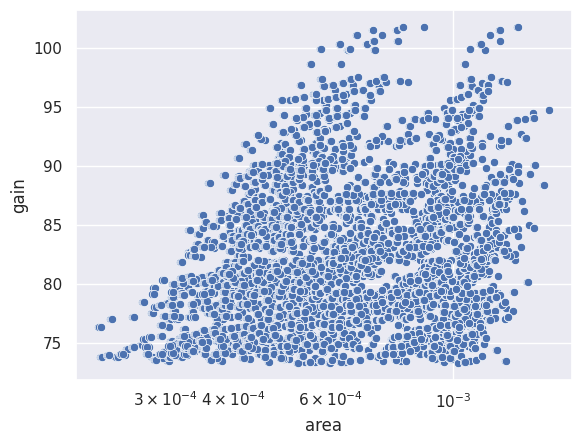

In [19]:
sns.scatterplot(data=ota_df_new, x="area", y="gain")
plt.xscale("log")

In [20]:
ota_df_new.to_csv("ota_df_new" + ".csv")

# PM tryout

In [133]:
ota_df_new = pd.read_csv('data/ota_df.csv')  

In [134]:
OTA_2stage_primitive = Primitive(parameters={Symbol("Ra_2stage"): ota_df_new["Ra_2stage"].values,
                                  Symbol("gma_2stage"): ota_df_new["gma_2stage"].values,
                                  Symbol("Cin_2stage"): ota_df_new["Cin_2stage"].values,

                                  Symbol("Ra_1stage"): ota_df_new["Ra_1stage"].values,
                                  Symbol("gma_1stage"): ota_df_new["gma_1stage"].values,

                                  Symbol("Cc"): ota_df_new["Cc"].values,
                                  Symbol("Rc"): ota_df_new["Rc"].values,})
OTA_2stage_primitive.outputs = {
    Symbol("W_2stage"): ota_df_new["W_2stage"].values,
    Symbol("L_2stage"): ota_df_new["L_2stage"].values,
    Symbol("vin_2stage"): ota_df_new["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_df_new["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_df_new["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_df_new["vgs_cs_2stage"].values,
    
    Symbol("W_diff"): ota_df_new["W_diff"].values,
    Symbol("L_diff"): ota_df_new["L_diff"].values,
    Symbol("vout_1stage"): ota_df_new["vout_1stage"].values,
    Symbol("W_al"): ota_df_new["W_al"].values,
    Symbol("L_al"): ota_df_new["L_al"].values,
    Symbol("W_cs"): ota_df_new["W_cs"].values,
    Symbol("L_cs"): ota_df_new["L_cs"].values,
    Symbol("vgs_cs"): ota_df_new["vgs_cs"].values,
    
    Symbol("W_cc"): ota_df_new["W_cc"].values,
    Symbol("L_cc"): ota_df_new["L_cc"].values,
    
    Symbol("W_rc"): ota_df_new["W_rc"].values,
    Symbol("L_rc"): ota_df_new["L_rc"].values}

In [136]:
OTA_macro.ext_mask = None

OTA_macro.primitives = [OTA_2stage_primitive]
OTA_macro.submacromodels = []
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, phase_margin_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OpAmp_2stage
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_2stage, gma_2stage, Cin_2stage, Ra_1stage, gma_1stage, Cc, Rc) <function _lambdifygenerated at 0x7f4107133640>
#### creating the primods_list ####
primmods_outputs_aux:  {W_2stage: array([9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 9.72348562e-06, 9.72348562e-06, 9.72348562e-06,
       9.72348562e-06, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,
       2.18344849e-05, 2.18344849e-05, 2.18344849e-05, 2.18344849e-05,


In [137]:
ota_df["gain"] = 20*np.log10(ota_df["gain_OTA"])
ota_df_new["phase_margin_OTA"] = ota_df["phase_margin_OTA"]

In [138]:
ota_df_new = ota_df_new[(ota_df_new["phase_margin_OTA"]>65) & (ota_df_new["phase_margin_OTA"]<100)]
ota_df_new

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,...,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_wc,phase_margin_OTA
53,163655,7.232598e+05,0.000175,3.726669e-12,92541.862203,0.000447,1.000000e-10,10000.00000,5227.931873,7.232598e+05,...,0.000003,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000807,74.366598,76.609148,91.354553
62,168029,1.259731e+06,0.000175,3.726669e-12,92553.217653,0.000447,1.000000e-10,10000.00000,9105.595058,1.259731e+06,...,0.000006,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000864,79.186167,80.377872,91.257355
95,257963,3.837652e+05,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,3162.27766,4899.165936,3.837652e+05,...,0.000002,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.000744,73.802443,75.977294,68.208862
98,257966,3.837652e+05,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,10000.00000,4899.165936,3.837652e+05,...,0.000002,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000746,73.802443,75.977294,98.905223
104,262337,5.053025e+05,0.000306,5.189703e-13,91805.651089,0.000455,1.000000e-10,3162.27766,6450.451515,5.053025e+05,...,0.000003,0.7,0.000258,0.000258,0.000002,5.000000e-07,0.001015,76.191802,77.575206,68.170775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800,1842173,5.334497e+05,0.000311,2.720098e-12,101407.101834,0.000460,1.000000e-10,10000.00000,7736.383924,5.334497e+05,...,0.000003,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.001288,77.770760,79.718445,71.126932
806,1846544,7.045380e+05,0.000311,2.720098e-12,101389.387184,0.000460,1.000000e-10,3162.27766,10217.612633,7.045380e+05,...,0.000003,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001045,80.186989,82.569797,67.829865
809,1846547,7.045380e+05,0.000311,2.720098e-12,101389.387184,0.000460,1.000000e-10,10000.00000,10217.612633,7.045380e+05,...,0.000003,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.001047,80.186989,82.569797,71.091441
815,1850918,1.204005e+06,0.000311,2.720098e-12,101395.256527,0.000460,1.000000e-10,3162.27766,17461.167262,1.204005e+06,...,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001103,84.841465,86.289369,67.793823


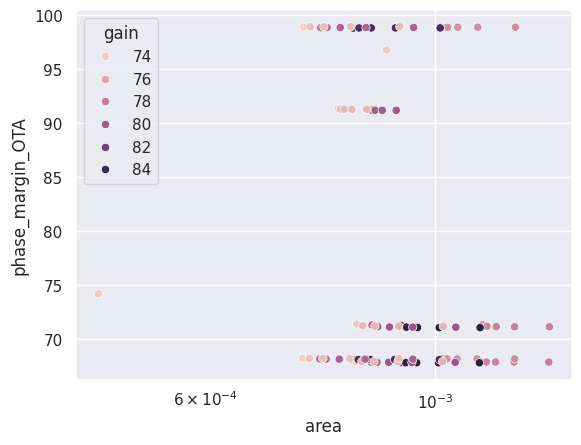

In [139]:
sns.scatterplot(data=ota_df_new, x="area", y="phase_margin_OTA", hue="gain")
plt.xscale("log")

In [140]:
W_diff = ota_df_new["W_diff"].values*1e6
L_diff = ota_df_new["L_diff"].values*1e6

W_al = ota_df_new["W_al"].values*1e6
L_al = ota_df_new["L_al"].values*1e6

W_cs = ota_df_new["W_cs"].values*1e6
L_cs = ota_df_new["L_cs"].values*1e6

W_2stage = ota_df_new["W_2stage"].values*1e6
L_2stage = ota_df_new["L_2stage"].values*1e6

Cc = ota_df_new["Cc"].values
Rc = ota_df_new["Rc"].values

mult_diff = []
for idx, i in enumerate(W_diff):
    if i>100:
        mult_diff.append(10)
    else:
        mult_diff.append(1)

mult_al = []
for idx, i in enumerate(W_al):
    if i>100:
        mult_al.append(10)
    else:
        mult_al.append(1)

values = {
    "XM1": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM2": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM3": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM4": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM5": [
        W_2stage,
        L_2stage,
        mult_diff,
        "nfet",
    ],
    "XM6": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM7": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM8": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "I2": np.full(len(W_diff), I_amp2),
    "Cc": Cc,
    "Rc": Rc
}

simulation_results = spice_sim("ota_2stage_tb", values)

[array([117.06683064, 117.06683064, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789,  93.18145421,  93.18145421,
       117.06683064, 117.06683064, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 117.06683064, 117.06683064,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       117.06683064, 117.06683064, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.2

Using SPARSE 1.3 as Direct Linear Solver
Note: Starting dynamic gmin stepping
Note: Dynamic gmin stepping completed

Note: No compatibility mode selected!


Circuit: ** sch_path: /workspaces/usm-vlsi-tools/shared_xserver/sstadex/test/tesis_notebooks/xschem/ota_2stage_tb.sch

Doing analysis at TEMP = 27.000000 and TNOM = 27.000000

 Reference value :  1.00000e+00
No. of Data Rows : 91
Note: Simulation executed from .control section 
test numer:  1
** sch_path: /workspaces/usm-vlsi-tools/shared_xserver/SSTADEx/test/Tesis_notebooks/xschem/ota_2stage_tb.sch

**.subckt ota_2stage_tb

XM1
['XM1', 'vout_s1', 'vn', 'vs', 'vs', 'sg13_hv_nmos', 'L=0.44999999999999996u', 'W=117.0668306444u', 'ng=1', 'm=1']
XM1 vout_s1 vn vs vs sg13_hv_nmos L=0.44999999999999996u W=117.0668306444u ng=1 m=1 

XM2
['XM2', 'net2', 'net1', 'vs', 'vs', 'sg13_hv_nmos', 'L=0.44999999999999996u', 'W=117.0668306444u', 'ng=1', 'm=1']
XM2 net2 net1 vs vs sg13_hv_nmos L=0.44999999999999996u W=117.0668306444u ng=1 m=1 

XM3
['

In [141]:
gain_error = []

for df in simulation_results:
    gain_error.append(float(df.columns[1]))

ota_df_new["gain_sim"]=gain_error
ota_df_new["gain_error"] = (np.abs(np.asarray(gain_error) - ota_df_new["gain"].values)/np.asarray(gain_error))*100

In [142]:
sim_pm = []

for sim in simulation_results:
    gain = np.abs(sim.iloc[:,1])
    fc_arg = np.argmin(gain)
    phase = sim.iloc[fc_arg,3]
    sim_pm.append(phase*180/np.pi)

In [143]:
ota_df_new.sort_values(by="area")

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,...,W_cc,L_cc,W_rc,L_rc,area,gain,gain_wc,phase_margin_OTA,gain_sim,gain_error
169,374137,223061.541186,0.000585,1.799146e-13,84905.356752,0.000459,3.162278e-12,10000.00000,5086.159591,223061.541186,...,0.000046,0.000046,0.000004,5.000000e-07,0.000473,74.127800,73.529391,74.190450,74.275225,0.198485
95,257963,383765.189022,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,3162.27766,4899.165936,383765.189022,...,0.000258,0.000258,0.000002,5.000000e-07,0.000744,73.802443,75.977294,68.208862,73.691269,0.150864
98,257966,383765.189022,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,10000.00000,4899.165936,383765.189022,...,0.000258,0.000258,0.000004,5.000000e-07,0.000746,73.802443,75.977294,98.905223,73.691269,0.150864
266,773123,383765.189022,0.000306,5.189703e-13,98835.213799,0.000458,1.000000e-10,3162.27766,5312.874191,383765.189022,...,0.000258,0.000258,0.000002,5.000000e-07,0.000756,74.506591,76.680738,68.195086,74.443517,0.084727
269,773126,383765.189022,0.000306,5.189703e-13,98835.213799,0.000458,1.000000e-10,10000.00000,5312.874191,383765.189022,...,0.000258,0.000258,0.000004,5.000000e-07,0.000757,74.506591,76.680738,98.922804,74.443516,0.084728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,1498733,533449.732448,0.000311,2.720098e-12,101123.714448,0.000459,1.000000e-10,10000.00000,7712.320808,533449.732448,...,0.000258,0.000258,0.000004,5.000000e-07,0.001193,77.743702,79.691397,71.132365,77.866773,0.158053
761,1807817,505302.470758,0.000306,5.189703e-13,101407.101834,0.000460,1.000000e-10,3162.27766,7197.787429,505302.470758,...,0.000258,0.000258,0.000002,5.000000e-07,0.001193,77.143980,78.526445,68.152681,77.266391,0.158427
764,1807820,505302.470758,0.000306,5.189703e-13,101407.101834,0.000460,1.000000e-10,10000.00000,7197.787429,505302.470758,...,0.000258,0.000258,0.000004,5.000000e-07,0.001195,77.143980,78.526445,98.888065,77.266391,0.158426
797,1842170,533449.732448,0.000311,2.720098e-12,101407.101834,0.000460,1.000000e-10,3162.27766,7736.383924,533449.732448,...,0.000258,0.000258,0.000002,5.000000e-07,0.001287,77.770760,79.718445,67.857595,77.894101,0.158345


In [144]:
ota_df_new["pm_sim"]=sim_pm
ota_df_new["pm_error"]=(np.abs(ota_df_new["phase_margin_OTA"].values-sim_pm)/np.abs(sim_pm))*100

In [145]:
ota_df_new.sort_values(by="area")[(ota_df_new["W_diff"]<2e-4) & (ota_df_new["W_al"]<2e-4)]

/tmp/ipykernel_635/3711184159.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ota_df_new.sort_values(by="area")[(ota_df_new["W_diff"]<2e-4) & (ota_df_new["W_al"]<2e-4)]


,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,rout_OTA,...,W_rc,L_rc,area,gain,gain_wc,phase_margin_OTA,gain_sim,gain_error,pm_sim,pm_error
169,374137,223061.541186,0.000585,1.799146e-13,84905.356752,0.000459,3.162278e-12,10000.00000,5086.159591,223061.541186,...,0.000004,5.000000e-07,0.000473,74.127800,73.529391,74.190450,74.275225,0.198485,71.034436,4.442935
95,257963,383765.189022,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,3162.27766,4899.165936,383765.189022,...,0.000002,5.000000e-07,0.000744,73.802443,75.977294,68.208862,73.691269,0.150864,71.748764,4.933747
98,257966,383765.189022,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,10000.00000,4899.165936,383765.189022,...,0.000004,5.000000e-07,0.000746,73.802443,75.977294,98.905223,73.691269,0.150864,95.821901,3.217763
266,773123,383765.189022,0.000306,5.189703e-13,98835.213799,0.000458,1.000000e-10,3162.27766,5312.874191,383765.189022,...,0.000002,5.000000e-07,0.000756,74.506591,76.680738,68.195086,74.443517,0.084727,71.682782,4.865459
269,773126,383765.189022,0.000306,5.189703e-13,98835.213799,0.000458,1.000000e-10,10000.00000,5312.874191,383765.189022,...,0.000004,5.000000e-07,0.000757,74.506591,76.680738,98.922804,74.443516,0.084728,95.219220,3.889534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,1498733,533449.732448,0.000311,2.720098e-12,101123.714448,0.000459,1.000000e-10,10000.00000,7712.320808,533449.732448,...,0.000004,5.000000e-07,0.001193,77.743702,79.691397,71.132365,77.866773,0.158053,55.173504,28.924863
761,1807817,505302.470758,0.000306,5.189703e-13,101407.101834,0.000460,1.000000e-10,3162.27766,7197.787429,505302.470758,...,0.000002,5.000000e-07,0.001193,77.143980,78.526445,68.152681,77.266391,0.158427,67.279514,1.297820
764,1807820,505302.470758,0.000306,5.189703e-13,101407.101834,0.000460,1.000000e-10,10000.00000,7197.787429,505302.470758,...,0.000004,5.000000e-07,0.001195,77.143980,78.526445,98.888065,77.266391,0.158426,79.995741,23.616662
797,1842170,533449.732448,0.000311,2.720098e-12,101407.101834,0.000460,1.000000e-10,3162.27766,7736.383924,533449.732448,...,0.000002,5.000000e-07,0.001287,77.770760,79.718445,67.857595,77.894101,0.158345,67.673928,0.271400


In [2]:
test_df = pd.read_csv('ota_1stage_2.csv')

In [7]:
test_df["gain"] = 20*np.log10(test_df["gain_OTA"])
test_df["gain_2stage"] = 20*np.log10(test_df["gma_2stage"]*test_df["Ra_2stage"])
test_df["gain_1stage"] = 20*np.log10(test_df["gma_1stage"]*test_df["Ra_1stage"])
test_df[test_df["gain"]>73.33].sort_values(by="gain_1stage")

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_diff,...,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_2stage,gain_1stage
1307167,1307167,1000000.0,0.000316,3.162278e-14,8.004466e+04,0.000470,1.000000e-10,1000.00000,1.189230e+04,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000966,81.50532,50.0,31.50532
1400047,1400047,10000000.0,0.000316,3.162278e-14,8.004466e+04,0.000470,1.000000e-13,1000.00000,1.189230e+05,0.000117,...,6.400000e-06,0.7,0.000008,0.000008,0.000001,5.000000e-07,0.000466,101.50532,70.0,31.50532
1870927,1870927,10000000.0,0.001778,1.778279e-15,8.004466e+04,0.000470,1.000000e-10,1000.00000,6.687534e+05,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000966,116.50532,85.0,31.50532
1417327,1417327,10000000.0,0.000316,3.162278e-14,8.004466e+04,0.000470,1.000000e-10,10000.00000,1.189230e+05,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.000969,101.50532,70.0,31.50532
1695967,1695967,100000.0,0.001778,3.162278e-14,8.004466e+04,0.000470,1.000000e-10,1000.00000,6.687534e+03,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000966,76.50532,45.0,31.50532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313013,313013,1000000.0,0.000010,1.778279e-15,1.303724e+06,0.000359,1.000000e-13,1000.00000,4.682659e+03,0.000301,...,8.000000e-07,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000386,73.40985,20.0,53.40985
418853,418853,10000000.0,0.000010,1.778279e-15,1.303724e+06,0.000359,3.162278e-12,3162.27766,4.682659e+04,0.000301,...,8.000000e-07,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000463,93.40985,40.0,53.40985
1740773,1740773,100000.0,0.001778,1.000000e-11,1.303724e+06,0.000359,3.162278e-12,3162.27766,8.327075e+04,0.000301,...,8.000000e-07,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000463,98.40985,45.0,53.40985
1347653,1347653,1000000.0,0.000316,1.000000e-11,1.303724e+06,0.000359,1.000000e-10,1000.00000,1.480787e+05,0.000301,...,8.000000e-07,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000887,103.40985,50.0,53.40985


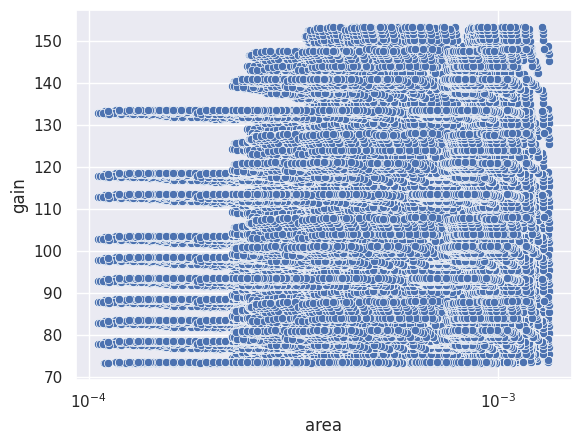

In [5]:
sns.scatterplot(data=test_df[test_df["gain"]>73.33], x="area", y="gain")
plt.xscale("log")

In [28]:
test_df.sort_values(by=["gain_1stage", "gain_2stage"], ascending=[False, True])

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_diff,...,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_2stage,gain_1stage
16504,16504,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-13,1000.00000,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000008,0.000008,0.000001,5.000000e-07,0.000232,76.255016,35.0,41.255016
16864,16864,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-11,1000.00000,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000082,0.000082,0.000001,5.000000e-07,0.000378,76.255016,35.0,41.255016
17224,17224,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-09,1000.00000,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000816,0.000816,0.000001,5.000000e-07,0.001848,76.255016,35.0,41.255016
17584,17584,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-13,3162.27766,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000008,0.000008,0.000002,5.000000e-07,0.000232,76.255016,35.0,41.255016
17944,17944,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-11,3162.27766,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000082,0.000082,0.000002,5.000000e-07,0.000379,76.255016,35.0,41.255016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384717,384717,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-11,3162.27766,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000082,0.000082,0.000002,5.000000e-07,0.000361,130.750099,100.0,30.750099
385557,385557,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-09,3162.27766,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000816,0.000816,0.000002,5.000000e-07,0.001830,130.750099,100.0,30.750099
386397,386397,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-13,10000.00000,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000008,0.000008,0.000004,5.000000e-07,0.000215,130.750099,100.0,30.750099
387237,387237,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-11,10000.00000,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000082,0.000082,0.000004,5.000000e-07,0.000362,130.750099,100.0,30.750099
